In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.optim.lr_scheduler as lr_scheduler
from torch.optim.lr_scheduler import _LRScheduler
import torch.utils.data as data

import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models

from sklearn import decomposition
from sklearn import manifold
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from tqdm.notebook import tqdm, trange
import matplotlib.pyplot as plt
import numpy as np

import copy
from collections import namedtuple
import os
import random
import shutil
import time
import collections
import math
import pandas as pd
import copy

from keras.layers import Input, Conv2D, MaxPool2D, Dropout, Flatten, Dense
from tensorflow.keras.models import Model

## Preprocessing

If you want the result to be reproducible, you will need to set the seed.

In [ ]:
SEED = 1234

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

Mount to Google drive and unpack your dataset

In [ ]:
from google.colab import drive
drive.mount('/content/Drive')

Mounted at /content/Drive


In [ ]:
drive.mount("/content/Drive", force_remount=True)

Mounted at /content/Drive


In [ ]:
shutil.unpack_archive("/content/Drive/MyDrive/MSc_Project/ISIC_balanced_split.zip", "/content/Drive/MyDrive/MSc_Project/ISIC_balanced_split")

In [ ]:
# Define a function to recursively count items in a folder
def count_items(folderpath):
  for root, dirs, files in os.walk(folderpath):
    for d in dirs:
      dir_path = os.path.join(root, d)
      dir_name = os.path.basename(dir_path)
      file_count = len([f for f in os.listdir(dir_path) if os.path.isfile(os.path.join(dir_path, f))])
      dir_path = os.path.join(root, d)
      print("Total number of items in folder: ", dir_path,file_count)




# Call the function with the folder path you want to count items in

count_items("/content/Drive/MyDrive/MSc_Project/ISIC_balanced_split")


Total number of items in folder:  /content/Drive/MyDrive/MSc_Project/ISIC_balanced_split/valid 0
Total number of items in folder:  /content/Drive/MyDrive/MSc_Project/ISIC_balanced_split/train_valid 0
Total number of items in folder:  /content/Drive/MyDrive/MSc_Project/ISIC_balanced_split/ISIC2017_test 0
Total number of items in folder:  /content/Drive/MyDrive/MSc_Project/ISIC_balanced_split/train 0
Total number of items in folder:  /content/Drive/MyDrive/MSc_Project/ISIC_balanced_split/valid/oth 981
Total number of items in folder:  /content/Drive/MyDrive/MSc_Project/ISIC_balanced_split/valid/mel 981
Total number of items in folder:  /content/Drive/MyDrive/MSc_Project/ISIC_balanced_split/train_valid/oth 4905
Total number of items in folder:  /content/Drive/MyDrive/MSc_Project/ISIC_balanced_split/train_valid/mel 4905
Total number of items in folder:  /content/Drive/MyDrive/MSc_Project/ISIC_balanced_split/ISIC2017_test/unknown 600
Total number of items in folder:  /content/Drive/MyDrive/

Image resizing and normalization

In [ ]:
batch_size = 32
transform_train = transforms.Compose([
    transforms.Resize((32,32)),
    transforms.ToTensor(),
    transforms.Normalize([-1.3048, -1.2044, -0.9766],
                                     [0.6709, 0.6858, 0.6829])
   ])

transform_test = transforms.Compose([
    transforms.ToPILImage(),  # Convert to PIL Image
    transforms.Resize((32, 32)),
    transforms.ToTensor(),
    transforms.Normalize([-1.3048, -1.2044, -0.9766], [0.6709, 0.6858, 0.6829])
])

Reading the dataset

In [ ]:
data_dir = '/content/Drive/MyDrive/MSc_Project/ISIC_balanced_split/'

train_ds, train_valid_ds = [datasets.ImageFolder(
    os.path.join(data_dir, folder),
    transform=transform_train) for folder in ['train', 'train_valid']]

valid_ds = datasets.ImageFolder(
    os.path.join(data_dir, 'valid'),
    transform=transform_test)


In [ ]:
train_ds

Dataset ImageFolder
    Number of datapoints: 7848
    Root location: /content/Drive/MyDrive/MSc_Project/ISIC_balanced_split/train
    StandardTransform
Transform: Compose(
               Resize(size=(32, 32), interpolation=bilinear, max_size=None, antialias=warn)
               ToTensor()
               Normalize(mean=[-1.3048, -1.2044, -0.9766], std=[0.6709, 0.6858, 0.6829])
           )

In [ ]:
train_valid_ds

Dataset ImageFolder
    Number of datapoints: 9810
    Root location: /content/Drive/MyDrive/MSc_Project/ISIC_balanced_split/train_valid
    StandardTransform
Transform: Compose(
               Resize(size=(32, 32), interpolation=bilinear, max_size=None, antialias=warn)
               ToTensor()
               Normalize(mean=[-1.3048, -1.2044, -0.9766], std=[0.6709, 0.6858, 0.6829])
           )

In [ ]:
valid_ds

Dataset ImageFolder
    Number of datapoints: 1962
    Root location: /content/Drive/MyDrive/MSc_Project/ISIC_balanced_split/valid
    StandardTransform
Transform: Compose(
               ToPILImage()
               Resize(size=(32, 32), interpolation=bilinear, max_size=None, antialias=warn)
               ToTensor()
               Normalize(mean=[-1.3048, -1.2044, -0.9766], std=[0.6709, 0.6858, 0.6829])
           )

In [ ]:
train_iter, train_valid_iter = [torch.utils.data.DataLoader(
    dataset, batch_size, shuffle=True, drop_last=True)
    for dataset in (train_ds, train_valid_ds)]

valid_iter = torch.utils.data.DataLoader(valid_ds, batch_size, shuffle=False,
                                         drop_last=True)
valid_iter

# Model Design and Training

Define the CNN - this example will focus on ResNet and its variation. DO NOT CHANGE THE CODE IN THESE PARTS. MIT License: Copyright (c) 2018 Ben Trevett.

In [ ]:
class ResNet(nn.Module):
    def __init__(self, config, output_dim):
        super().__init__()

        block, n_blocks, channels = config
        self.in_channels = channels[0]

        assert len(n_blocks) == len(channels) == 4

        self.conv1 = nn.Conv2d(3, self.in_channels, kernel_size = 7, stride = 2, padding = 3, bias = False)
        self.bn1 = nn.BatchNorm2d(self.in_channels)
        self.relu = nn.ReLU(inplace = True)
        self.maxpool = nn.MaxPool2d(kernel_size = 3, stride = 2, padding = 1)

        self.layer1 = self.get_resnet_layer(block, n_blocks[0], channels[0])
        self.layer2 = self.get_resnet_layer(block, n_blocks[1], channels[1], stride = 2)
        self.layer3 = self.get_resnet_layer(block, n_blocks[2], channels[2], stride = 2)
        self.layer4 = self.get_resnet_layer(block, n_blocks[3], channels[3], stride = 2)

        self.avgpool = nn.AdaptiveAvgPool2d((1,1))
        self.fc = nn.Linear(self.in_channels, output_dim)

    def get_resnet_layer(self, block, n_blocks, channels, stride = 1):

        layers = []

        if self.in_channels != block.expansion * channels:
            downsample = True
        else:
            downsample = False

        layers.append(block(self.in_channels, channels, stride, downsample))

        for i in range(1, n_blocks):
            layers.append(block(block.expansion * channels, channels))

        self.in_channels = block.expansion * channels

        return nn.Sequential(*layers)

    def forward(self, x):

        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        x = self.avgpool(x)
        h = x.view(x.shape[0], -1)
        x = self.fc(h)

        return x, h

class BasicBlock(nn.Module):

    expansion = 1

    def __init__(self, in_channels, out_channels, stride = 1, downsample = False):
        super().__init__()

        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size = 3,
                               stride = stride, padding = 1, bias = False)
        self.bn1 = nn.BatchNorm2d(out_channels)

        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size = 3,
                               stride = 1, padding = 1, bias = False)
        self.bn2 = nn.BatchNorm2d(out_channels)

        self.relu = nn.ReLU(inplace = True)

        if downsample:
            conv = nn.Conv2d(in_channels, out_channels, kernel_size = 1,
                             stride = stride, bias = False)
            bn = nn.BatchNorm2d(out_channels)
            downsample = nn.Sequential(conv, bn)
        else:
            downsample = None

        self.downsample = downsample

    def forward(self, x):

        i = x

        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.bn2(x)

        if self.downsample is not None:
            i = self.downsample(i)

        x += i
        x = self.relu(x)

        return x

ResNetConfig = namedtuple('ResNetConfig', ['block', 'n_blocks', 'channels'])
resnet18_config = ResNetConfig(block = BasicBlock,
                               n_blocks = [2,2,2,2],
                               channels = [64, 128, 256, 512])

resnet34_config = ResNetConfig(block = BasicBlock,
                               n_blocks = [3,4,6,3],
                               channels = [64, 128, 256, 512])

class Bottleneck(nn.Module):

    expansion = 4

    def __init__(self, in_channels, out_channels, stride = 1, downsample = False):
        super().__init__()

        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size = 1,
                               stride = 1, bias = False)
        self.bn1 = nn.BatchNorm2d(out_channels)

        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size = 3,
                               stride = stride, padding = 1, bias = False)
        self.bn2 = nn.BatchNorm2d(out_channels)

        self.conv3 = nn.Conv2d(out_channels, self.expansion * out_channels, kernel_size = 1,
                               stride = 1, bias = False)
        self.bn3 = nn.BatchNorm2d(self.expansion * out_channels)

        self.relu = nn.ReLU(inplace = True)

        if downsample:
            conv = nn.Conv2d(in_channels, self.expansion * out_channels, kernel_size = 1,
                             stride = stride, bias = False)
            bn = nn.BatchNorm2d(self.expansion * out_channels)
            downsample = nn.Sequential(conv, bn)
        else:
            downsample = None

        self.downsample = downsample

    def forward(self, x):

        i = x

        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)

        x = self.conv3(x)
        x = self.bn3(x)

        if self.downsample is not None:
            i = self.downsample(i)

        x += i
        x = self.relu(x)

        return x

resnet50_config = ResNetConfig(block = Bottleneck,
                               n_blocks = [3, 4, 6, 3],
                               channels = [64, 128, 256, 512])

resnet101_config = ResNetConfig(block = Bottleneck,
                                n_blocks = [3, 4, 23, 3],
                                channels = [64, 128, 256, 512])

resnet152_config = ResNetConfig(block = Bottleneck,
                                n_blocks = [3, 8, 36, 3],
                                channels = [64, 128, 256, 512])

HERE you can start to define your model, you can use different resnet for your work.

In [ ]:
pretrained_model = models.resnet50(pretrained = True)
IN_FEATURES = pretrained_model.fc.in_features
OUTPUT_DIM = len(train_ds.classes)

fc = nn.Linear(IN_FEATURES, OUTPUT_DIM)
pretrained_model.fc = fc
model = ResNet(resnet50_config, OUTPUT_DIM)
model.load_state_dict(pretrained_model.state_dict())

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 321MB/s]


<All keys matched successfully>

In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f'The model has {count_parameters(model):,} trainable parameters')

The model has 23,512,130 trainable parameters


# Setting the hyperparameters and train the model - 10 Epochs

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

criterion = nn.CrossEntropyLoss()

model = model.to(device)
criterion = criterion.to(device)

FOUND_LR = 1e-3

params = [
          {'params': model.conv1.parameters(), 'lr': FOUND_LR / 10},
          {'params': model.bn1.parameters(), 'lr': FOUND_LR / 10},
          {'params': model.layer1.parameters(), 'lr': FOUND_LR / 8},
          {'params': model.layer2.parameters(), 'lr': FOUND_LR / 6},
          {'params': model.layer3.parameters(), 'lr': FOUND_LR / 4},
          {'params': model.layer4.parameters(), 'lr': FOUND_LR / 2},
          {'params': model.fc.parameters()}
         ]

optimizer = optim.Adam(params, lr = FOUND_LR)

In [ ]:
EPOCHS = 10
STEPS_PER_EPOCH = len(train_iter)
TOTAL_STEPS = EPOCHS * STEPS_PER_EPOCH

MAX_LRS = [p['lr'] for p in optimizer.param_groups]

scheduler = lr_scheduler.OneCycleLR(optimizer,
                                    max_lr = MAX_LRS,
                                    total_steps = TOTAL_STEPS)

In [ ]:
def calculate_topk_accuracy(y_pred, y, k = 2):
    with torch.no_grad():
        batch_size = y.shape[0]
        _, top_pred = y_pred.topk(k, 1)
        top_pred = top_pred.t()
        correct = top_pred.eq(y.view(1, -1).expand_as(top_pred))
        correct_1 = correct[:1].reshape(-1).float().sum(0, keepdim = True)
        correct_k = correct[:k].reshape(-1).float().sum(0, keepdim = True)
        acc_1 = correct_1 / batch_size
        acc_k = correct_k / batch_size
    return acc_1, acc_k

In [ ]:
def train(model, iterator, optimizer, criterion, scheduler, device):

    epoch_loss = 0
    epoch_acc_1 = 0
    epoch_acc_5 = 0

    model.train()

    for (x, y) in iterator:

        x = x.to(device)
        y = y.to(device)

        optimizer.zero_grad()

        y_pred, _ = model(x)

        loss = criterion(y_pred, y)

        acc_1, acc_5 = calculate_topk_accuracy(y_pred, y)

        loss.backward()

        optimizer.step()

        scheduler.step()

        epoch_loss += loss.item()
        epoch_acc_1 += acc_1.item()
        epoch_acc_5 += acc_5.item()

    epoch_loss /= len(iterator)
    epoch_acc_1 /= len(iterator)
    epoch_acc_5 /= len(iterator)

    return epoch_loss, epoch_acc_1, epoch_acc_5

In [ ]:
def evaluate(model, iterator, criterion, device):

    epoch_loss = 0
    epoch_acc_1 = 0
    epoch_acc_5 = 0

    model.eval()

    with torch.no_grad():

        for (x, y) in iterator:

            x = x.to(device)
            y = y.to(device)

            y_pred, _ = model(x)

            loss = criterion(y_pred, y)

            acc_1, acc_5 = calculate_topk_accuracy(y_pred, y)

            epoch_loss += loss.item()
            epoch_acc_1 += acc_1.item()
            epoch_acc_5 += acc_5.item()

    epoch_loss /= len(iterator)
    epoch_acc_1 /= len(iterator)
    epoch_acc_5 /= len(iterator)

    return epoch_loss, epoch_acc_1, epoch_acc_5

In [ ]:
def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

In [ ]:
# keeping-track-of-losses
train_losses = []
valid_losses = []

best_valid_loss = float('inf')

for epoch in range(EPOCHS):

    start_time = time.monotonic()

    train_loss, train_acc_1, train_acc_5 = train(model, train_iter, optimizer, criterion, scheduler, device)
    valid_loss, valid_acc_1, valid_acc_5 = evaluate(model, valid_iter, criterion, device)

    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
       # print(epoch)
        model_path = '/content/Drive/MyDrive/MSc_Project/best-model-10.pt'
        torch.save(model.state_dict(), 'best-model.pt')

    end_time = time.monotonic()

    epoch_mins, epoch_secs = epoch_time(start_time, end_time)

    print(f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc @1: {train_acc_1*100:6.2f}% | ' \
          f'Train Acc @5: {train_acc_5*100:6.2f}%')
    print(f'\tValid Loss: {valid_loss:.3f} | Valid Acc @1: {valid_acc_1*100:6.2f}% | ' \
          f'Valid Acc @5: {valid_acc_5*100:6.2f}%')

Epoch: 01 | Epoch Time: 31m 12s
	Train Loss: 0.550 | Train Acc @1:  71.36% | Train Acc @5: 100.00%
	Valid Loss: 0.502 | Valid Acc @1:  75.67% | Valid Acc @5: 100.00%
Epoch: 02 | Epoch Time: 5m 25s
	Train Loss: 0.455 | Train Acc @1:  77.63% | Train Acc @5: 100.00%
	Valid Loss: 0.456 | Valid Acc @1:  76.69% | Valid Acc @5: 100.00%
Epoch: 03 | Epoch Time: 5m 25s
	Train Loss: 0.406 | Train Acc @1:  81.15% | Train Acc @5: 100.00%
	Valid Loss: 0.429 | Valid Acc @1:  80.94% | Valid Acc @5: 100.00%
Epoch: 04 | Epoch Time: 5m 23s
	Train Loss: 0.367 | Train Acc @1:  83.65% | Train Acc @5: 100.00%
	Valid Loss: 0.461 | Valid Acc @1:  80.84% | Valid Acc @5: 100.00%
Epoch: 05 | Epoch Time: 5m 25s
	Train Loss: 0.355 | Train Acc @1:  84.17% | Train Acc @5: 100.00%
	Valid Loss: 0.422 | Valid Acc @1:  81.45% | Valid Acc @5: 100.00%
Epoch: 06 | Epoch Time: 5m 22s
	Train Loss: 0.272 | Train Acc @1:  88.38% | Train Acc @5: 100.00%
	Valid Loss: 0.476 | Valid Acc @1:  82.02% | Valid Acc @5: 100.00%
Epoch: 07

In [ ]:
def get_predictions(model, iterator):

    model.eval()

    images = []
    labels = []
    probs = []

    with torch.no_grad():

        for (x, y) in iterator:

            x = x.to(device)

            y_pred, _ = model(x)

            y_prob = F.softmax(y_pred, dim = -1)
            top_pred = y_prob.argmax(1, keepdim = True)

            images.append(x.cpu())
            labels.append(y.cpu())
            probs.append(y_prob.cpu())

    images = torch.cat(images, dim = 0)
    labels = torch.cat(labels, dim = 0)
    probs = torch.cat(probs, dim = 0)

    return images, labels, probs

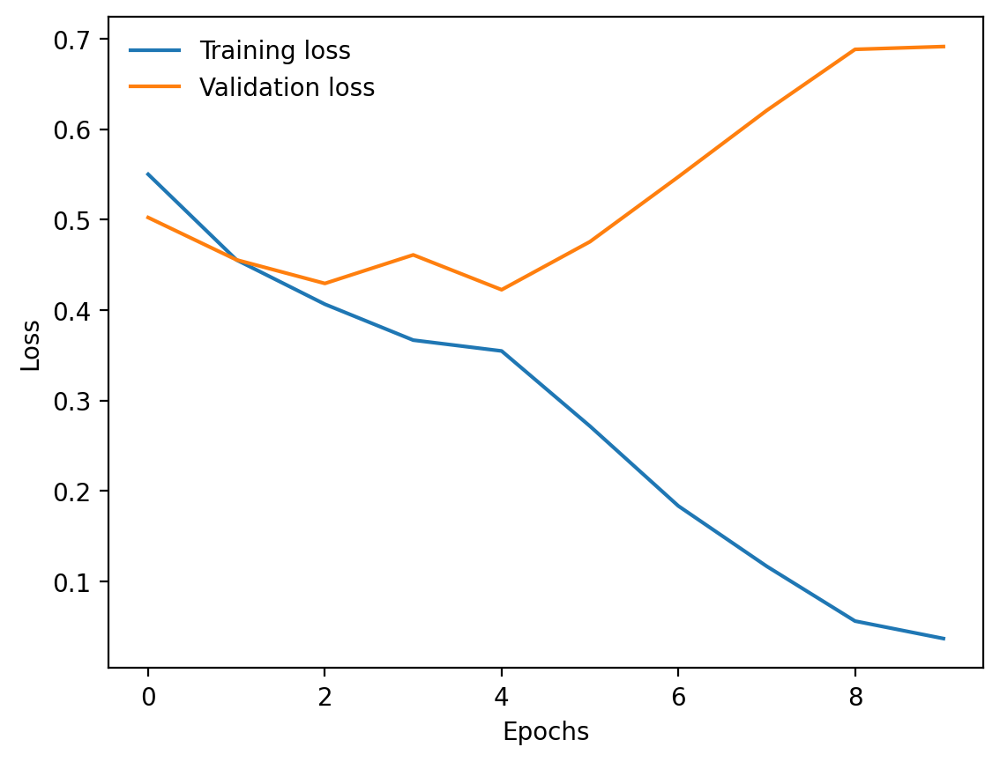

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

plt.plot(train_losses, label='Training loss')
plt.plot(valid_losses, label='Validation loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(frameon=False)

Loading the best model

In [ ]:
model.load_state_dict(torch.load('best-model.pt'))

<All keys matched successfully>

In [ ]:
images, labels, probs = get_predictions(model, test_iter)

In [ ]:
import csv

csv_file = 'ground_truth.csv'

with open(csv_file, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['image_file', 'class_1', 'class_0'])
    for image_file, label in test_ds.samples:
        row = [image_file]
        # Convert the label to binary format with four classes
        binary_label = [int(label == i) for i in range(2)]  # Replace 4 with the number of classes
        row.extend(binary_label)
        writer.writerow(row)

file.close()


In [ ]:
csv_file

'ground_truth.csv'

In [ ]:
test = pd.read_csv('ground_truth.csv')
y_test = np.array(test.drop(['image_file'], axis=1))
y_test

array([[1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [0, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [0,

In [ ]:
print("Shape of y_test:", y_test.shape)
print("Shape of probs:", probs.shape)

Shape of y_test: (77, 2)
Shape of probs: torch.Size([77, 2])


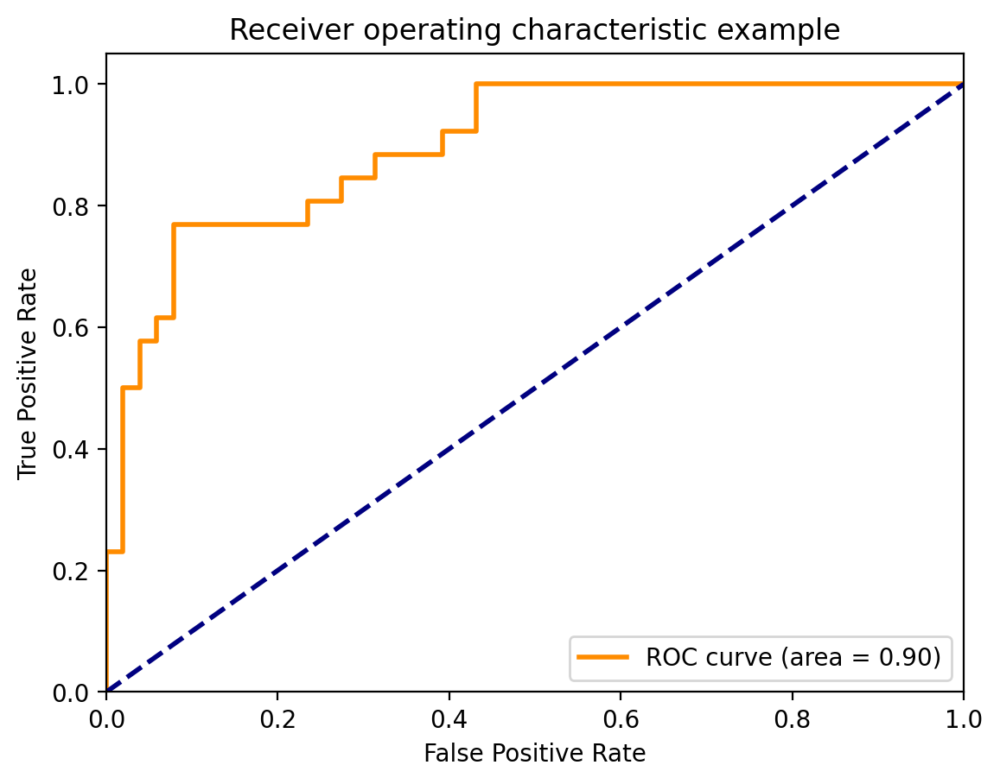

<ipython-input-30-fb88da89d21b>:45: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


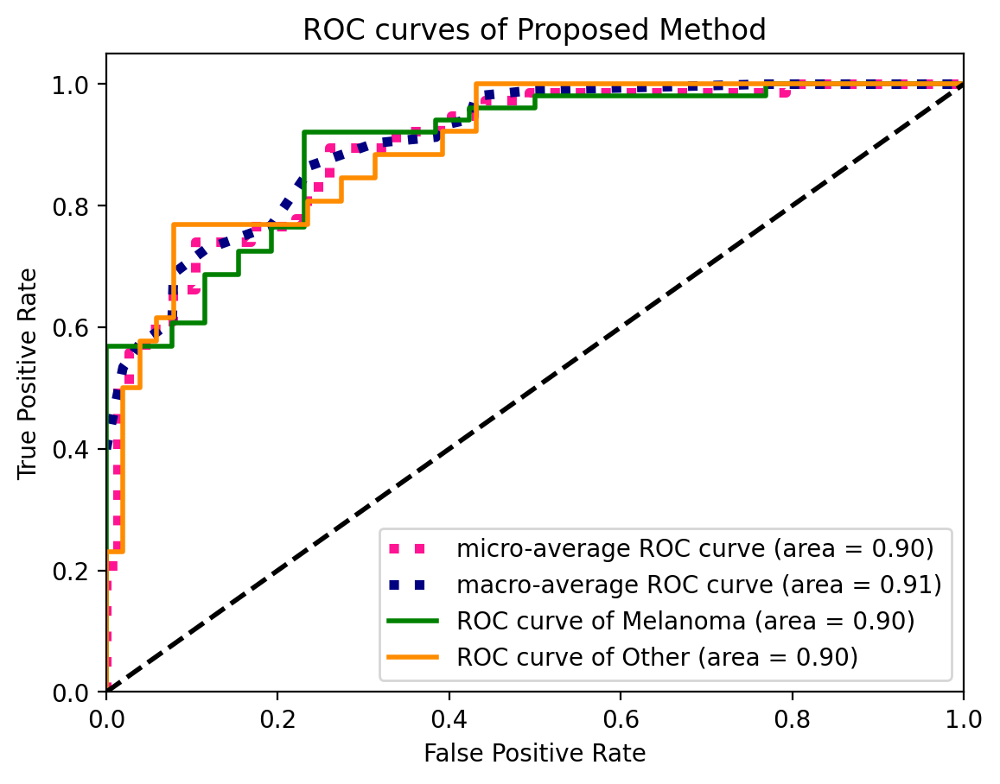

In [ ]:
from itertools import cycle

from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
#change to OneVsOneClassifier for generalized AUC
#from sklearn.multiclass import OneVsOneClassifier
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_fscore_support

n_classes=2

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), probs.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

plt.figure()
lw = 2
plt.plot(fpr[1], tpr[1], color='darkorange',lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[1])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

plt.plot(fpr[0], tpr[0], color='green', lw=lw,
         label='ROC curve of Melanoma (area = {1:0.2f})'
         ''.format(0, roc_auc[0]))

plt.plot(fpr[1], tpr[1], color='darkorange', lw=lw,
         label='ROC curve of Other (area = {1:0.2f})'
         ''.format(1, roc_auc[1]))

# if you need more classes
# plt.plot(fpr[2], tpr[2], color='red', lw=lw,
#          label='ROC curve of third class (area = {1:0.2f})'
#          ''.format(1, roc_auc[2]))

# plt.plot(fpr[3], tpr[3], color='cornflowerblue', lw=lw,
#          label='ROC curve of fourth class (area = {1:0.2f})'
#          ''.format(1, roc_auc[3]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curves of Proposed Method')
plt.legend(loc="lower right")
plt.show()

[[40 11]
 [ 6 20]]
[0 1]
[51 26]
[[51. 51.]
 [26. 26.]]


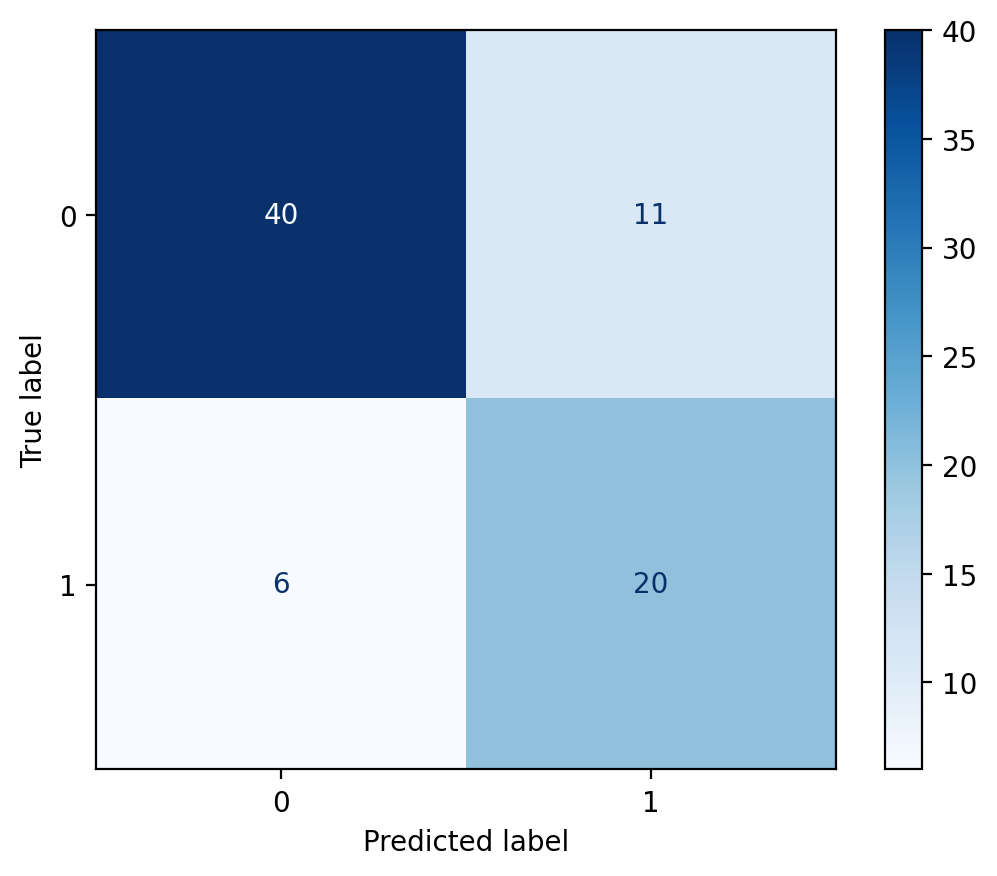

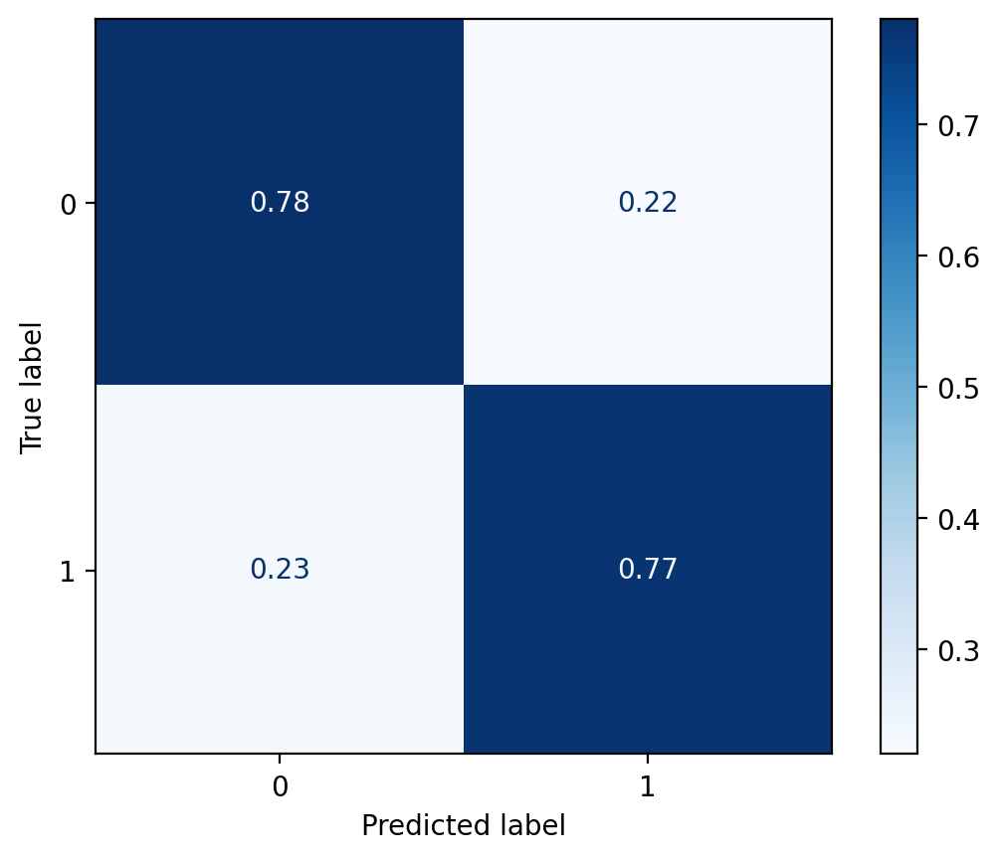

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels
from matplotlib.colors import Normalize
from sklearn.metrics import ConfusionMatrixDisplay

pred_class = np.argmax(probs,axis=1)
true_class = np.argmax(y_test, axis=1)

cm=confusion_matrix(true_class, pred_class)
class_names = unique_labels(true_class, pred_class)
print(cm)
print(class_names)

disp = ConfusionMatrixDisplay(cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)

C = cm
divisor = np.zeros((2,2))
divisor[0][:] = 51
divisor[1][:] = 26

cm_normalised=np.divide(cm, divisor)
print(np.transpose(C.sum(axis=1)))
print(divisor)
cm_normalised = np.round(cm_normalised, 2)
disp = ConfusionMatrixDisplay(cm_normalised, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues, values_format='')

# Setting the hyperparameters and train the model - 20 Epochs

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

criterion = nn.CrossEntropyLoss()

model = model.to(device)
criterion = criterion.to(device)

FOUND_LR = 1e-3

params = [
          {'params': model.conv1.parameters(), 'lr': FOUND_LR / 10},
          {'params': model.bn1.parameters(), 'lr': FOUND_LR / 10},
          {'params': model.layer1.parameters(), 'lr': FOUND_LR / 8},
          {'params': model.layer2.parameters(), 'lr': FOUND_LR / 6},
          {'params': model.layer3.parameters(), 'lr': FOUND_LR / 4},
          {'params': model.layer4.parameters(), 'lr': FOUND_LR / 2},
          {'params': model.fc.parameters()}
         ]

optimizer = optim.Adam(params, lr = FOUND_LR)

In [ ]:
EPOCHS = 20
STEPS_PER_EPOCH = len(train_iter)
TOTAL_STEPS = EPOCHS * STEPS_PER_EPOCH

MAX_LRS = [p['lr'] for p in optimizer.param_groups]

scheduler = lr_scheduler.OneCycleLR(optimizer,
                                    max_lr = MAX_LRS,
                                    total_steps = TOTAL_STEPS)

In [ ]:
def calculate_topk_accuracy(y_pred, y, k = 2):
    with torch.no_grad():
        batch_size = y.shape[0]
        _, top_pred = y_pred.topk(k, 1)
        top_pred = top_pred.t()
        correct = top_pred.eq(y.view(1, -1).expand_as(top_pred))
        correct_1 = correct[:1].reshape(-1).float().sum(0, keepdim = True)
        correct_k = correct[:k].reshape(-1).float().sum(0, keepdim = True)
        acc_1 = correct_1 / batch_size
        acc_k = correct_k / batch_size
    return acc_1, acc_k

In [ ]:
def train(model, iterator, optimizer, criterion, scheduler, device):

    epoch_loss = 0
    epoch_acc_1 = 0
    epoch_acc_5 = 0

    model.train()

    for (x, y) in iterator:

        x = x.to(device)
        y = y.to(device)

        optimizer.zero_grad()

        y_pred, _ = model(x)

        loss = criterion(y_pred, y)

        acc_1, acc_5 = calculate_topk_accuracy(y_pred, y)

        loss.backward()

        optimizer.step()

        scheduler.step()

        epoch_loss += loss.item()
        epoch_acc_1 += acc_1.item()
        epoch_acc_5 += acc_5.item()

    epoch_loss /= len(iterator)
    epoch_acc_1 /= len(iterator)
    epoch_acc_5 /= len(iterator)

    return epoch_loss, epoch_acc_1, epoch_acc_5

In [ ]:
def evaluate(model, iterator, criterion, device):

    epoch_loss = 0
    epoch_acc_1 = 0
    epoch_acc_5 = 0

    model.eval()

    with torch.no_grad():

        for (x, y) in iterator:

            x = x.to(device)
            y = y.to(device)

            y_pred, _ = model(x)

            loss = criterion(y_pred, y)

            acc_1, acc_5 = calculate_topk_accuracy(y_pred, y)

            epoch_loss += loss.item()
            epoch_acc_1 += acc_1.item()
            epoch_acc_5 += acc_5.item()

    epoch_loss /= len(iterator)
    epoch_acc_1 /= len(iterator)
    epoch_acc_5 /= len(iterator)

    return epoch_loss, epoch_acc_1, epoch_acc_5

In [ ]:
def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

In [ ]:
# keeping-track-of-losses
train_losses = []
valid_losses = []

best_valid_loss = float('inf')

for epoch in range(EPOCHS):

    start_time = time.monotonic()

    train_loss, train_acc_1, train_acc_5 = train(model, train_iter, optimizer, criterion, scheduler, device)
    valid_loss, valid_acc_1, valid_acc_5 = evaluate(model, valid_iter, criterion, device)

    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
       # print(epoch)
        model_path = '/content/Drive/MyDrive/MSc_Project/best-model-20.pt'
        torch.save(model.state_dict(), model_path)

    end_time = time.monotonic()

    epoch_mins, epoch_secs = epoch_time(start_time, end_time)

    print(f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc @1: {train_acc_1*100:6.2f}% | ' \
          f'Train Acc @5: {train_acc_5*100:6.2f}%')
    print(f'\tValid Loss: {valid_loss:.3f} | Valid Acc @1: {valid_acc_1*100:6.2f}% | ' \
          f'Valid Acc @5: {valid_acc_5*100:6.2f}%')

Epoch: 01 | Epoch Time: 5m 13s
	Train Loss: 0.232 | Train Acc @1:  90.26% | Train Acc @5: 100.00%
	Valid Loss: 0.523 | Valid Acc @1:  81.51% | Valid Acc @5: 100.00%
Epoch: 02 | Epoch Time: 5m 13s
	Train Loss: 0.198 | Train Acc @1:  91.89% | Train Acc @5: 100.00%
	Valid Loss: 0.525 | Valid Acc @1:  80.23% | Valid Acc @5: 100.00%
Epoch: 03 | Epoch Time: 5m 13s
	Train Loss: 0.216 | Train Acc @1:  91.10% | Train Acc @5: 100.00%
	Valid Loss: 0.666 | Valid Acc @1:  79.05% | Valid Acc @5: 100.00%
Epoch: 04 | Epoch Time: 5m 13s
	Train Loss: 0.291 | Train Acc @1:  88.18% | Train Acc @5: 100.00%
	Valid Loss: 0.543 | Valid Acc @1:  78.79% | Valid Acc @5: 100.00%
Epoch: 05 | Epoch Time: 5m 14s
	Train Loss: 0.248 | Train Acc @1:  89.46% | Train Acc @5: 100.00%
	Valid Loss: 0.568 | Valid Acc @1:  79.15% | Valid Acc @5: 100.00%
Epoch: 06 | Epoch Time: 5m 18s
	Train Loss: 0.330 | Train Acc @1:  85.70% | Train Acc @5: 100.00%
	Valid Loss: 0.529 | Valid Acc @1:  78.12% | Valid Acc @5: 100.00%
Epoch: 07 

In [ ]:
def get_predictions(model, iterator):

    model.eval()

    images = []
    labels = []
    probs = []

    with torch.no_grad():

        for (x, y) in iterator:

            x = x.to(device)

            y_pred, _ = model(x)

            y_prob = F.softmax(y_pred, dim = -1)
            top_pred = y_prob.argmax(1, keepdim = True)

            images.append(x.cpu())
            labels.append(y.cpu())
            probs.append(y_prob.cpu())

    images = torch.cat(images, dim = 0)
    labels = torch.cat(labels, dim = 0)
    probs = torch.cat(probs, dim = 0)

    return images, labels, probs

# Inference

# Experiment 1

In [ ]:
import cv2

# Define the file paths to your three images
image_paths = [
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0024899_oth_s_d.jpg',
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0024899_oth_s_b.jpg',
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0024899_oth_s_l.jpg'
]

# Initialize an empty list to store the loaded images
test_images = []

# Load the images
for image_path in image_paths:
    img = cv2.imread(image_path)
    if img is not None:
        test_images.append(img)


In [ ]:
model_path = '/content/Drive/MyDrive/MSc_Project/best-model-20.pt'  # Path to your saved model
model.load_state_dict(torch.load(model_path, map_location=device))

<All keys matched successfully>

In [ ]:
import torch
import numpy as np
from torchvision import transforms


# Initialize an empty list to store the predicted labels and probabilities
predicted_labels = []
predicted_probs = []

# Set the model in evaluation mode
model.eval()

# Define a device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Preprocess and perform inference for each image
for image_numpy in test_images:
    # Apply the test transformation directly to the NumPy array
    preprocessed_image = transform_test(image_numpy)

    # Convert the preprocessed image to a PyTorch tensor
    image_tensor = preprocessed_image.unsqueeze(0).to(device)

    # Perform inference
    with torch.no_grad():
        outputs, _ = model(image_tensor)  # Adjust this line based on your model's output format
        probabilities = torch.softmax(outputs, dim=1)  # Compute class probabilities
        _, predicted_label = torch.max(outputs, 1)  # Get the predicted class label

    # Append the predicted label and probabilities to the lists
    predicted_labels.append(predicted_label.item())
    predicted_probs.append(probabilities.squeeze().cpu().numpy())

# Now, 'predicted_labels' contains the predicted class labels for each image,
# and 'predicted_probs' contains the class probabilities for each image.


In [ ]:
predicted_labels

[0, 0, 0]

In [ ]:
predicted_probs

[array([0.71746576, 0.2825342 ], dtype=float32),
 array([0.65511394, 0.34488612], dtype=float32),
 array([0.54104394, 0.4589561 ], dtype=float32)]

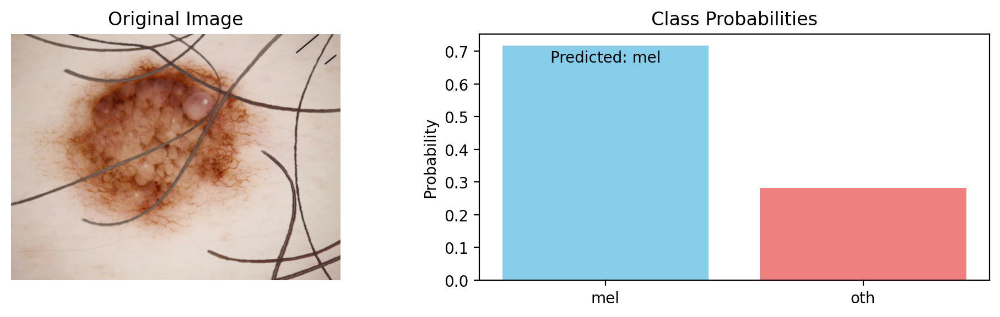

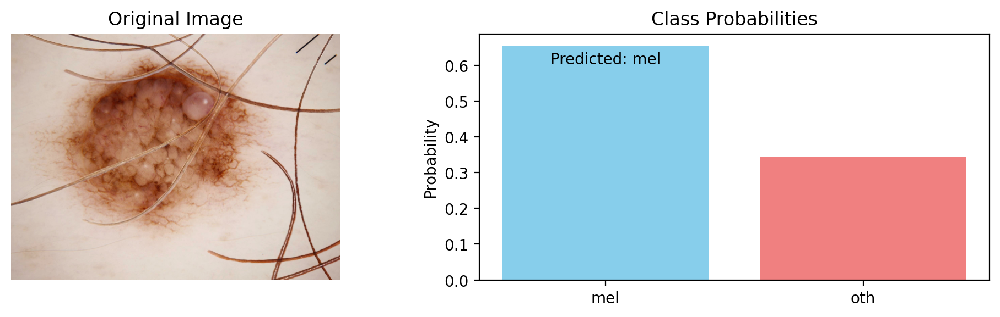

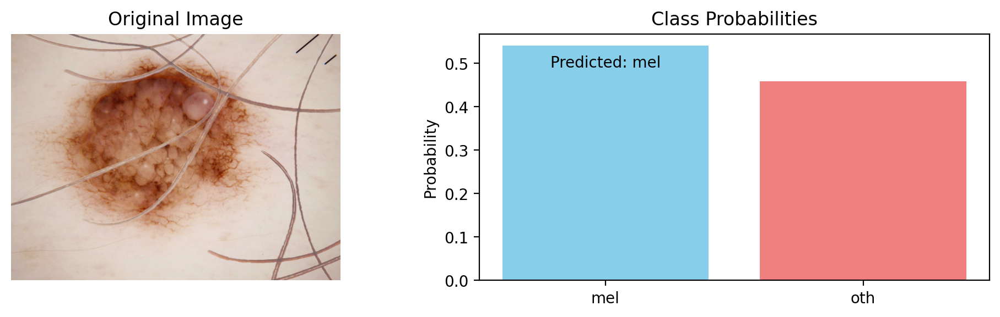

In [ ]:
# Define class labels based on your class indices
class_labels = {0: 'mel', 1: 'oth'}

# Define a list of colors for your bar chart
colors = ['#87CEEB', '#F08080']

for i in range(len(test_images)):
    # Load the original image
    original_image = cv2.imread(image_paths[i])

    # Get the predicted label and probabilities
    predicted_label = predicted_labels[i]
    predicted_probabilities = predicted_probs[i]

    # Create a figure with subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))

    # Display the original image
    ax1.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    ax1.axis('off')
    ax1.set_title('Original Image')

    # Create a bar chart for class probabilities
    ax2.bar(class_labels.values(), predicted_probabilities, color=colors)
    ax2.set_ylabel('Probability')
    ax2.set_title('Class Probabilities')

    # Add predicted label as text on the bar chart
    ax2.text(predicted_label, predicted_probabilities[predicted_label] - 0.05,
             f'Predicted: {class_labels[predicted_label]}', ha='center')

    # Show the plot
    plt.tight_layout()
    plt.show()


# Experiment 2

In [ ]:
import cv2

# Define the file paths to your three images
image_paths = [
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2017_0000151_mel_m_d.jpg',
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2017_0000151_mel_m_b.jpg',
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2017_0000151_mel_m_l.jpg'
]

# Initialize an empty list to store the loaded images
test_images = []

# Load the images
for image_path in image_paths:
    img = cv2.imread(image_path)
    if img is not None:
        test_images.append(img)

# Now, the test_images list contains your three specific images.


In [ ]:
model_path = '/content/Drive/MyDrive/MSc_Project/best-model-20.pt'  # Path to your saved model
model.load_state_dict(torch.load(model_path))

<All keys matched successfully>

In [ ]:
import torch
import numpy as np
from torchvision import transforms

# Assuming you have a pre-trained model loaded and defined as 'model'
# Also, 'test_images' contains the three images as NumPy arrays

# Initialize an empty list to store the predicted labels and probabilities
predicted_labels = []
predicted_probs = []

# Set the model in evaluation mode
model.eval()

# Define a device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define the test data transformation
transform_test = transforms.Compose([
    transforms.ToPILImage(),  # Convert to PIL Image
    transforms.Resize((32, 32)),
    transforms.ToTensor(),
    transforms.Normalize([-1.3048, -1.2044, -0.9766], [0.6709, 0.6858, 0.6829])
])

# Preprocess and perform inference for each image
for image_numpy in test_images:
    # Apply the test transformation directly to the NumPy array
    preprocessed_image = transform_test(image_numpy)

    # Convert the preprocessed image to a PyTorch tensor
    image_tensor = preprocessed_image.unsqueeze(0).to(device)

    # Perform inference
    with torch.no_grad():
        outputs, _ = model(image_tensor)  # Adjust this line based on your model's output format
        probabilities = torch.softmax(outputs, dim=1)  # Compute class probabilities
        _, predicted_label = torch.max(outputs, 1)  # Get the predicted class label

    # Append the predicted label and probabilities to the lists
    predicted_labels.append(predicted_label.item())
    predicted_probs.append(probabilities.squeeze().cpu().numpy())

# Now, 'predicted_labels' contains the predicted class labels for each image,
# and 'predicted_probs' contains the class probabilities for each image.


In [ ]:
predicted_labels

[1, 1, 1]

In [ ]:
predicted_probs

[array([0.4211048, 0.5788952], dtype=float32),
 array([0.34048298, 0.659517  ], dtype=float32),
 array([0.32342368, 0.6765763 ], dtype=float32)]

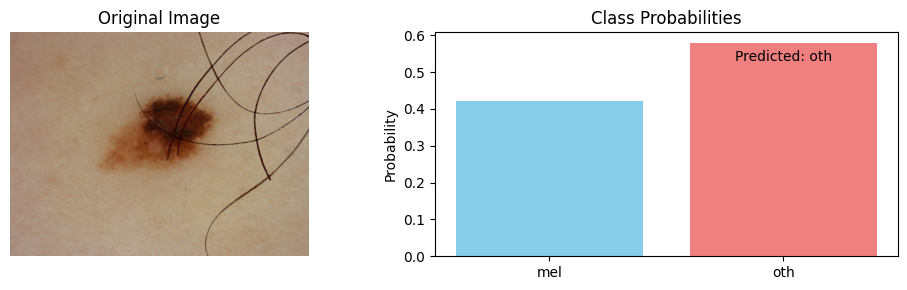

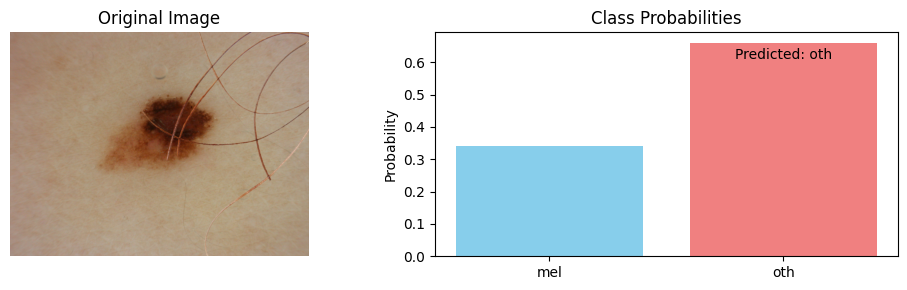

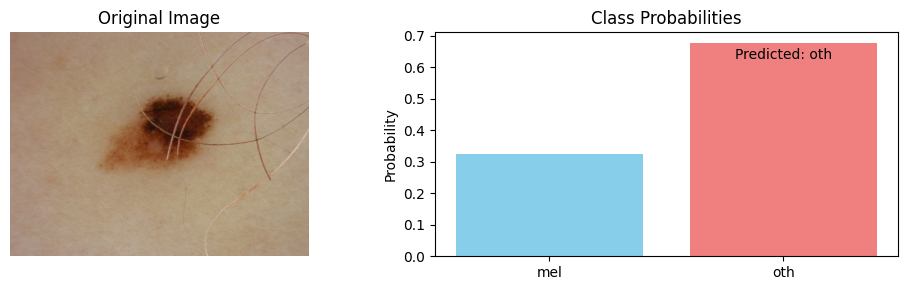

In [ ]:
# Define class labels based on your class indices
class_labels = {0: 'mel', 1: 'oth'}

# Define a list of colors for your bar chart
colors = ['#87CEEB', '#F08080']

for i in range(len(test_images)):
    # Load the original image
    original_image = cv2.imread(image_paths[i])

    # Get the predicted label and probabilities
    predicted_label = predicted_labels[i]
    predicted_probabilities = predicted_probs[i]

    # Create a figure with subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))

    # Display the original image
    ax1.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    ax1.axis('off')
    ax1.set_title('Original Image')

    # Create a bar chart for class probabilities
    ax2.bar(class_labels.values(), predicted_probabilities, color=colors)
    ax2.set_ylabel('Probability')
    ax2.set_title('Class Probabilities')

    # Add predicted label as text on the bar chart
    ax2.text(predicted_label, predicted_probabilities[predicted_label] - 0.05,
             f'Predicted: {class_labels[predicted_label]}', ha='center')

    # Show the plot
    plt.tight_layout()
    plt.show()


# Experiment 3

In [ ]:
import cv2

# Define the file paths to your three images
image_paths = [
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0073205_oth_s_d.jpg',
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0073205_oth_s_b.jpg',
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0073205_oth_s_l.jpg'
]

# Initialize an empty list to store the loaded images
test_images = []

# Load the images
for image_path in image_paths:
    img = cv2.imread(image_path)
    if img is not None:
        test_images.append(img)


In [ ]:
model_path = '/content/Drive/MyDrive/MSc_Project/best-model-20.pt'  # Path to your saved model
model.load_state_dict(torch.load(model_path, map_location=device))

<All keys matched successfully>

In [ ]:
import torch
import numpy as np
from torchvision import transforms

# Assuming you have a pre-trained model loaded and defined as 'model'
# Also, 'test_images' contains the three images as NumPy arrays

# Initialize an empty list to store the predicted labels and probabilities
predicted_labels = []
predicted_probs = []

# Set the model in evaluation mode
model.eval()

# Define a device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Preprocess and perform inference for each image
for image_numpy in test_images:
    # Apply the test transformation directly to the NumPy array
    preprocessed_image = transform_test(image_numpy)

    # Convert the preprocessed image to a PyTorch tensor
    image_tensor = preprocessed_image.unsqueeze(0).to(device)

    # Perform inference
    with torch.no_grad():
        outputs, _ = model(image_tensor)  # Adjust this line based on your model's output format
        probabilities = torch.softmax(outputs, dim=1)  # Compute class probabilities
        _, predicted_label = torch.max(outputs, 1)  # Get the predicted class label

    # Append the predicted label and probabilities to the lists
    predicted_labels.append(predicted_label.item())
    predicted_probs.append(probabilities.squeeze().cpu().numpy())

# Now, 'predicted_labels' contains the predicted class labels for each image,
# and 'predicted_probs' contains the class probabilities for each image.


In [ ]:
predicted_labels

[1, 1, 1]

In [ ]:
predicted_probs

[array([0.4019897 , 0.59801024], dtype=float32),
 array([0.3980556, 0.6019444], dtype=float32),
 array([0.39325514, 0.6067448 ], dtype=float32)]

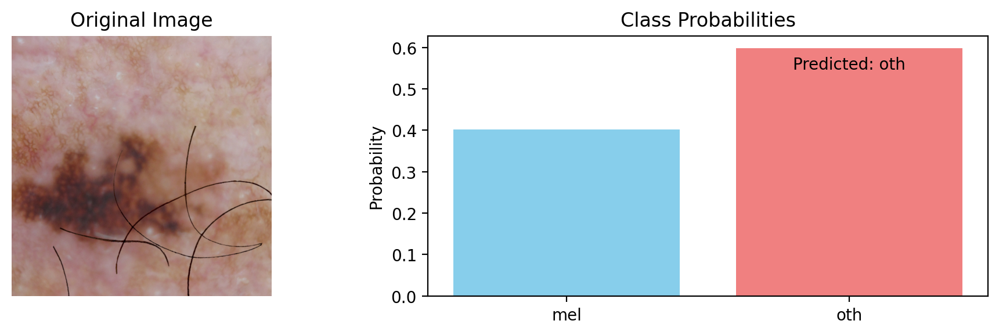

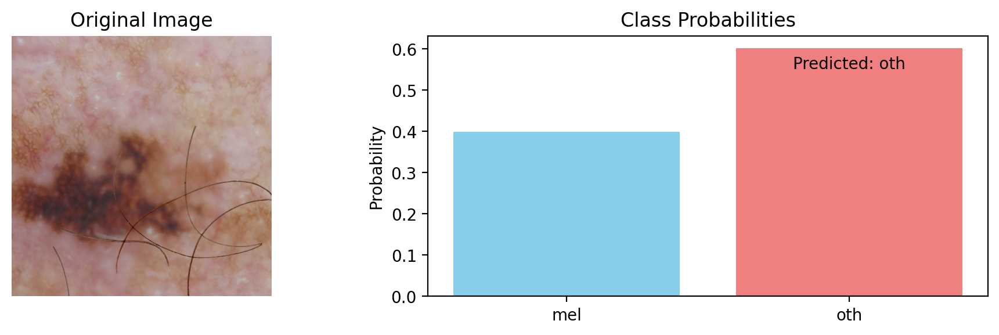

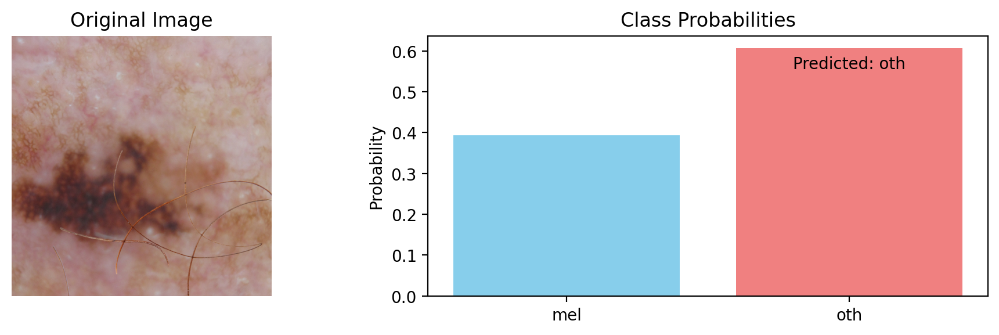

In [ ]:
# Define class labels based on your class indices
class_labels = {0: 'mel', 1: 'oth'}

# Define a list of colors for your bar chart
colors = ['#87CEEB', '#F08080']

for i in range(len(test_images)):
    # Load the original image
    original_image = cv2.imread(image_paths[i])

    # Get the predicted label and probabilities
    predicted_label = predicted_labels[i]
    predicted_probabilities = predicted_probs[i]

    # Create a figure with subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))

    # Display the original image
    ax1.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    ax1.axis('off')
    ax1.set_title('Original Image')

    # Create a bar chart for class probabilities
    ax2.bar(class_labels.values(), predicted_probabilities, color=colors)
    ax2.set_ylabel('Probability')
    ax2.set_title('Class Probabilities')

    # Add predicted label as text on the bar chart
    ax2.text(predicted_label, predicted_probabilities[predicted_label] - 0.05,
             f'Predicted: {class_labels[predicted_label]}', ha='center')

    # Show the plot
    plt.tight_layout()
    plt.show()


# Experiment 4

In [ ]:
import cv2

# Define the file paths to your three images
image_paths = [
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0028543_mel_s_d.jpg',
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0028543_mel_s_b.jpg',
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0028543_mel_s_l.jpg'
]

# Initialize an empty list to store the loaded images
test_images = []

# Load the images
for image_path in image_paths:
    img = cv2.imread(image_path)
    if img is not None:
        test_images.append(img)


In [ ]:
model_path = '/content/Drive/MyDrive/MSc_Project/best-model-20.pt'  # Path to your saved model
model.load_state_dict(torch.load(model_path, map_location=device))

<All keys matched successfully>

In [ ]:
import torch
import numpy as np
from torchvision import transforms

# Assuming you have a pre-trained model loaded and defined as 'model'
# Also, 'test_images' contains the three images as NumPy arrays

# Initialize an empty list to store the predicted labels and probabilities
predicted_labels = []
predicted_probs = []

# Set the model in evaluation mode
model.eval()

# Define a device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Preprocess and perform inference for each image
for image_numpy in test_images:
    # Apply the test transformation directly to the NumPy array
    preprocessed_image = transform_test(image_numpy)

    # Convert the preprocessed image to a PyTorch tensor
    image_tensor = preprocessed_image.unsqueeze(0).to(device)

    # Perform inference
    with torch.no_grad():
        outputs, _ = model(image_tensor)  # Adjust this line based on your model's output format
        probabilities = torch.softmax(outputs, dim=1)  # Compute class probabilities
        _, predicted_label = torch.max(outputs, 1)  # Get the predicted class label

    # Append the predicted label and probabilities to the lists
    predicted_labels.append(predicted_label.item())
    predicted_probs.append(probabilities.squeeze().cpu().numpy())

# Now, 'predicted_labels' contains the predicted class labels for each image,
# and 'predicted_probs' contains the class probabilities for each image.


In [ ]:
predicted_labels

[0, 0, 0]

In [ ]:
predicted_probs

[array([0.88196963, 0.11803041], dtype=float32),
 array([0.8689467 , 0.13105331], dtype=float32),
 array([0.8450331 , 0.15496695], dtype=float32)]

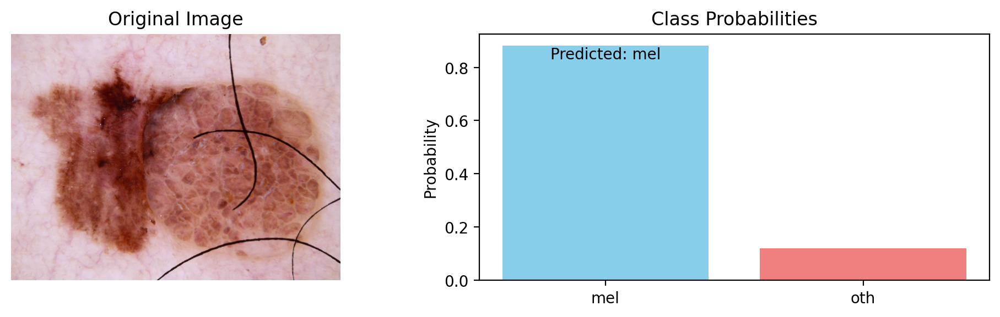

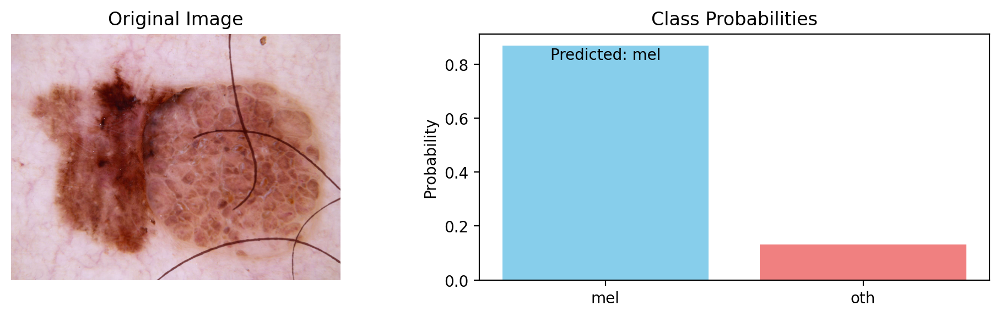

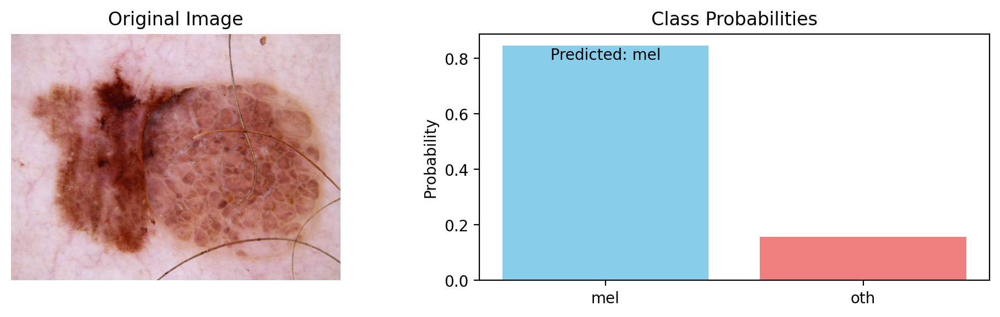

In [ ]:
# Define class labels based on your class indices
class_labels = {0: 'mel', 1: 'oth'}

# Define a list of colors for your bar chart
colors = ['#87CEEB', '#F08080']

for i in range(len(test_images)):
    # Load the original image
    original_image = cv2.imread(image_paths[i])

    # Get the predicted label and probabilities
    predicted_label = predicted_labels[i]
    predicted_probabilities = predicted_probs[i]

    # Create a figure with subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))

    # Display the original image
    ax1.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    ax1.axis('off')
    ax1.set_title('Original Image')

    # Create a bar chart for class probabilities
    ax2.bar(class_labels.values(), predicted_probabilities, color=colors)
    ax2.set_ylabel('Probability')
    ax2.set_title('Class Probabilities')

    # Add predicted label as text on the bar chart
    ax2.text(predicted_label, predicted_probabilities[predicted_label] - 0.05,
             f'Predicted: {class_labels[predicted_label]}', ha='center')

    # Show the plot
    plt.tight_layout()
    plt.show()


# Experiment 5

In [ ]:
import cv2

# Define the file paths to your three images
image_paths = [
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0000461_oth_l_d.jpg',
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0000461_oth_l_b.jpg',
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0000461_oth_l_l.jpg'
]

# Initialize an empty list to store the loaded images
test_images = []

# Load the images
for image_path in image_paths:
    img = cv2.imread(image_path)
    if img is not None:
        test_images.append(img)


In [ ]:
model_path = '/content/Drive/MyDrive/MSc_Project/best-model-20.pt'  # Path to your saved model
model.load_state_dict(torch.load(model_path, map_location=device))

<All keys matched successfully>

In [ ]:
import torch
import numpy as np
from torchvision import transforms

# Assuming you have a pre-trained model loaded and defined as 'model'
# Also, 'test_images' contains the three images as NumPy arrays

# Initialize an empty list to store the predicted labels and probabilities
predicted_labels = []
predicted_probs = []

# Set the model in evaluation mode
model.eval()

# Define a device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Preprocess and perform inference for each image
for image_numpy in test_images:
    # Apply the test transformation directly to the NumPy array
    preprocessed_image = transform_test(image_numpy)

    # Convert the preprocessed image to a PyTorch tensor
    image_tensor = preprocessed_image.unsqueeze(0).to(device)

    # Perform inference
    with torch.no_grad():
        outputs, _ = model(image_tensor)  # Adjust this line based on your model's output format
        probabilities = torch.softmax(outputs, dim=1)  # Compute class probabilities
        _, predicted_label = torch.max(outputs, 1)  # Get the predicted class label

    # Append the predicted label and probabilities to the lists
    predicted_labels.append(predicted_label.item())
    predicted_probs.append(probabilities.squeeze().cpu().numpy())

# Now, 'predicted_labels' contains the predicted class labels for each image,
# and 'predicted_probs' contains the class probabilities for each image.


In [ ]:
predicted_labels

[0, 0, 1]

In [ ]:
predicted_probs

[array([0.5829259, 0.4170741], dtype=float32),
 array([0.534852  , 0.46514797], dtype=float32),
 array([0.47780868, 0.52219135], dtype=float32)]

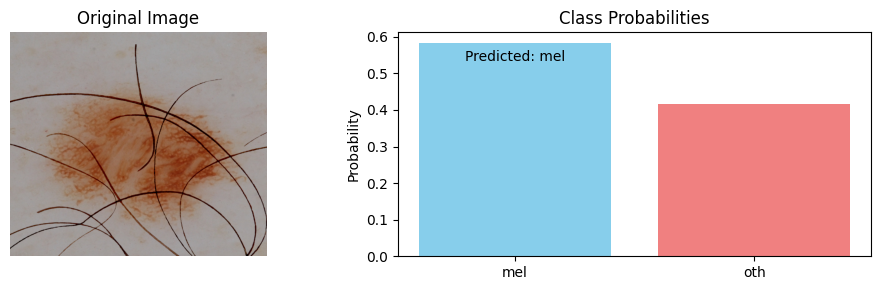

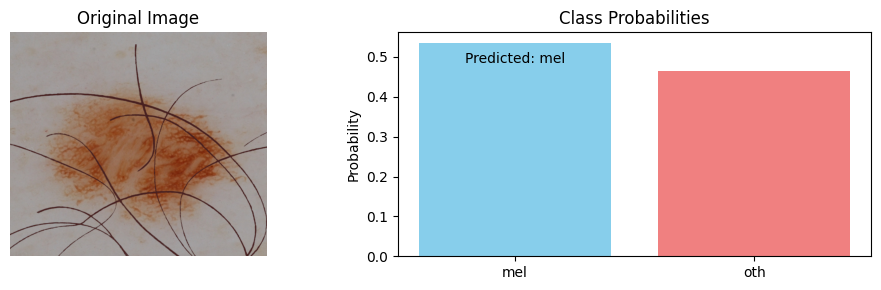

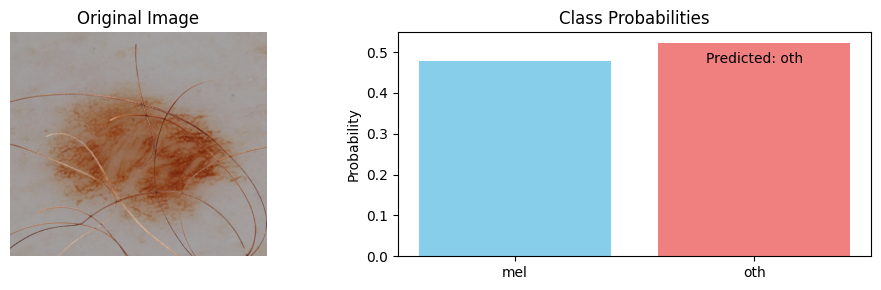

In [ ]:
# Define class labels based on your class indices
class_labels = {0: 'mel', 1: 'oth'}

# Define a list of colors for your bar chart
colors = ['#87CEEB', '#F08080']

for i in range(len(test_images)):
    # Load the original image
    original_image = cv2.imread(image_paths[i])

    # Get the predicted label and probabilities
    predicted_label = predicted_labels[i]
    predicted_probabilities = predicted_probs[i]

    # Create a figure with subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))

    # Display the original image
    ax1.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    ax1.axis('off')
    ax1.set_title('Original Image')

    # Create a bar chart for class probabilities
    ax2.bar(class_labels.values(), predicted_probabilities, color=colors)
    ax2.set_ylabel('Probability')
    ax2.set_title('Class Probabilities')

    # Add predicted label as text on the bar chart
    ax2.text(predicted_label, predicted_probabilities[predicted_label] - 0.05,
             f'Predicted: {class_labels[predicted_label]}', ha='center')

    # Show the plot
    plt.tight_layout()
    plt.show()


# Experiment 6

In [ ]:
import cv2

# Define the file paths to your three images
image_paths = [
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0000344_oth_s_d.jpg',
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0000344_oth_s_b.jpg',
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0000344_oth_s_l.jpg'
]

# Initialize an empty list to store the loaded images
test_images = []

# Load the images
for image_path in image_paths:
    img = cv2.imread(image_path)
    if img is not None:
        test_images.append(img)


In [ ]:
model_path = '/content/Drive/MyDrive/MSc_Project/best-model-20.pt'  # Path to your saved model
model.load_state_dict(torch.load(model_path, map_location=device))

<All keys matched successfully>

In [ ]:
import torch
import numpy as np
from torchvision import transforms

# Assuming you have a pre-trained model loaded and defined as 'model'
# Also, 'test_images' contains the three images as NumPy arrays

# Initialize an empty list to store the predicted labels and probabilities
predicted_labels = []
predicted_probs = []

# Set the model in evaluation mode
model.eval()

# Define a device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Preprocess and perform inference for each image
for image_numpy in test_images:
    # Apply the test transformation directly to the NumPy array
    preprocessed_image = transform_test(image_numpy)

    # Convert the preprocessed image to a PyTorch tensor
    image_tensor = preprocessed_image.unsqueeze(0).to(device)

    # Perform inference
    with torch.no_grad():
        outputs, _ = model(image_tensor)  # Adjust this line based on your model's output format
        probabilities = torch.softmax(outputs, dim=1)  # Compute class probabilities
        _, predicted_label = torch.max(outputs, 1)  # Get the predicted class label

    # Append the predicted label and probabilities to the lists
    predicted_labels.append(predicted_label.item())
    predicted_probs.append(probabilities.squeeze().cpu().numpy())

# Now, 'predicted_labels' contains the predicted class labels for each image,
# and 'predicted_probs' contains the class probabilities for each image.


In [ ]:
predicted_labels

[0, 1, 1]

In [ ]:
predicted_probs

[array([0.5114559 , 0.48854405], dtype=float32),
 array([0.4892782 , 0.51072174], dtype=float32),
 array([0.47504038, 0.5249596 ], dtype=float32)]

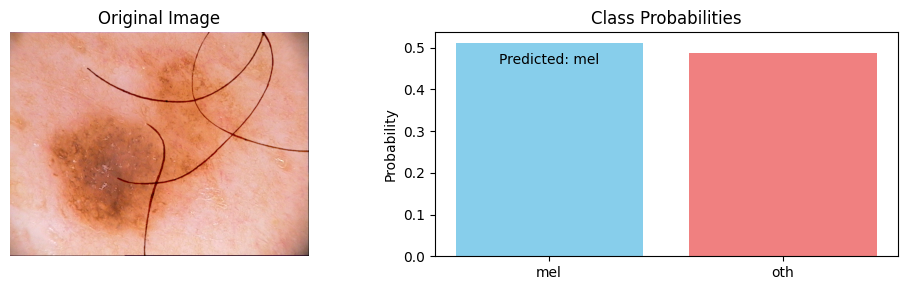

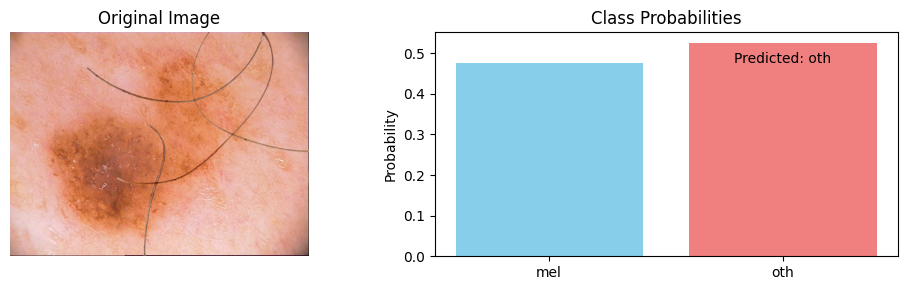

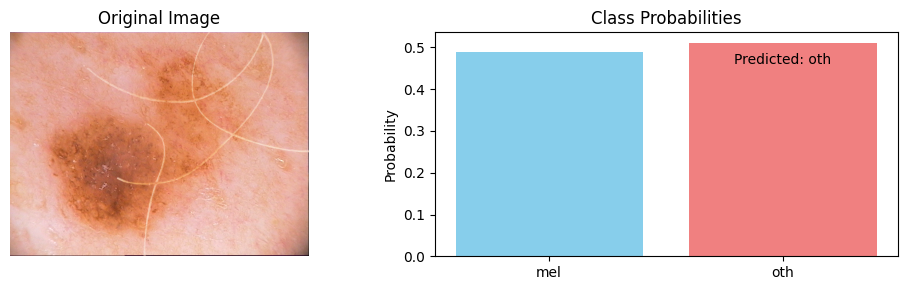

In [ ]:
# Define class labels based on your class indices
class_labels = {0: 'mel', 1: 'oth'}

# Define a list of colors for your bar chart
colors = ['#87CEEB', '#F08080']

for i in range(len(test_images)):
    # Load the original image
    original_image = cv2.imread(image_paths[i])

    # Get the predicted label and probabilities
    predicted_label = predicted_labels[i]
    predicted_probabilities = predicted_probs[i]

    # Create a figure with subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))

    # Display the original image
    ax1.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    ax1.axis('off')
    ax1.set_title('Original Image')

    # Create a bar chart for class probabilities
    ax2.bar(class_labels.values(), predicted_probabilities, color=colors)
    ax2.set_ylabel('Probability')
    ax2.set_title('Class Probabilities')

    # Add predicted label as text on the bar chart
    ax2.text(predicted_label, predicted_probabilities[predicted_label] - 0.05,
             f'Predicted: {class_labels[predicted_label]}', ha='center')

    # Show the plot
    plt.tight_layout()
    plt.show()


# Hair Removal

# Hair Removal Example 1

In [ ]:
import cv2

# Define the file paths to your three images
image_paths = [
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0000461_oth_s_d.jpg',
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0000461_oth_s_b.jpg',
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0000461_oth_s_l.jpg'
]

# Initialize an empty list to store the loaded images
test_images = []

# Load the images
for image_path in image_paths:
    img = cv2.imread(image_path)
    if img is not None:
        test_images.append(img)


In [ ]:
model_path = '/content/Drive/MyDrive/MSc_Project/best-model-20.pt'  # Path to your saved model
model.load_state_dict(torch.load(model_path, map_location=device))

<All keys matched successfully>

In [ ]:
import torch
import numpy as np
from torchvision import transforms

# Assuming you have a pre-trained model loaded and defined as 'model'
# Also, 'test_images' contains the three images as NumPy arrays

# Initialize an empty list to store the predicted labels and probabilities
predicted_labels = []
predicted_probs = []

# Set the model in evaluation mode
model.eval()

# Define a device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Preprocess and perform inference for each image
for image_numpy in test_images:
    # Apply the test transformation directly to the NumPy array
    preprocessed_image = transform_test(image_numpy)

    # Convert the preprocessed image to a PyTorch tensor
    image_tensor = preprocessed_image.unsqueeze(0).to(device)

    # Perform inference
    with torch.no_grad():
        outputs, _ = model(image_tensor)  # Adjust this line based on your model's output format
        probabilities = torch.softmax(outputs, dim=1)  # Compute class probabilities
        _, predicted_label = torch.max(outputs, 1)  # Get the predicted class label

    # Append the predicted label and probabilities to the lists
    predicted_labels.append(predicted_label.item())
    predicted_probs.append(probabilities.squeeze().cpu().numpy())

# Now, 'predicted_labels' contains the predicted class labels for each image,
# and 'predicted_probs' contains the class probabilities for each image.


In [ ]:
predicted_labels

[0, 0, 0]

In [ ]:
predicted_probs

[array([0.63281786, 0.3671822 ], dtype=float32),
 array([0.60226107, 0.39773896], dtype=float32),
 array([0.5738065 , 0.42619348], dtype=float32)]

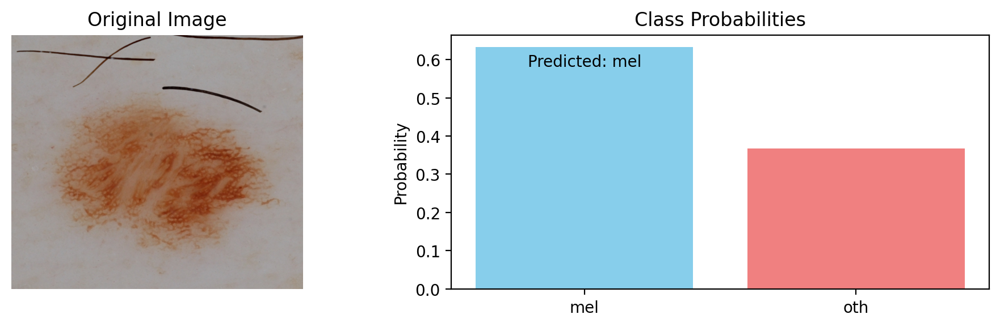

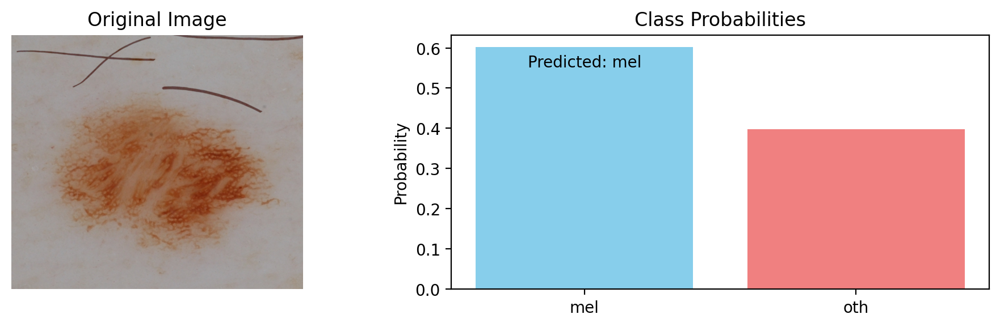

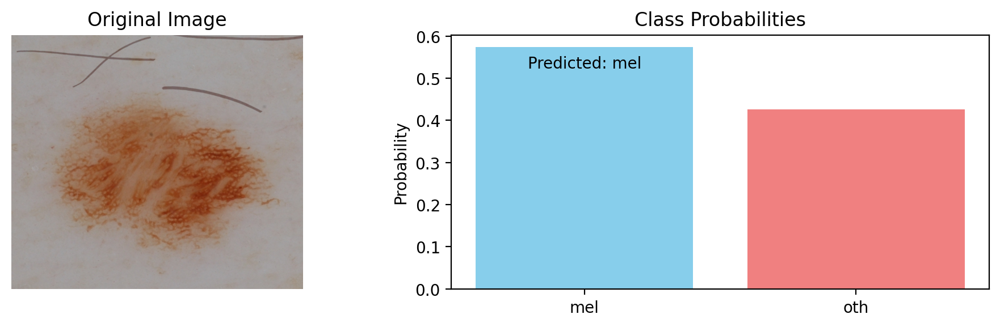

In [ ]:
# Define class labels based on your class indices
class_labels = {0: 'mel', 1: 'oth'}

# Define a list of colors for your bar chart
colors = ['#87CEEB', '#F08080']

for i in range(len(test_images)):
    # Load the original image
    original_image = cv2.imread(image_paths[i])

    # Get the predicted label and probabilities
    predicted_label = predicted_labels[i]
    predicted_probabilities = predicted_probs[i]

    # Create a figure with subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))

    # Display the original image
    ax1.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    ax1.axis('off')
    ax1.set_title('Original Image')

    # Create a bar chart for class probabilities
    ax2.bar(class_labels.values(), predicted_probabilities, color=colors)
    ax2.set_ylabel('Probability')
    ax2.set_title('Class Probabilities')

    # Add predicted label as text on the bar chart
    ax2.text(predicted_label, predicted_probabilities[predicted_label] - 0.05,
             f'Predicted: {class_labels[predicted_label]}', ha='center')

    # Show the plot
    plt.tight_layout()
    plt.show()


## Hair Removal

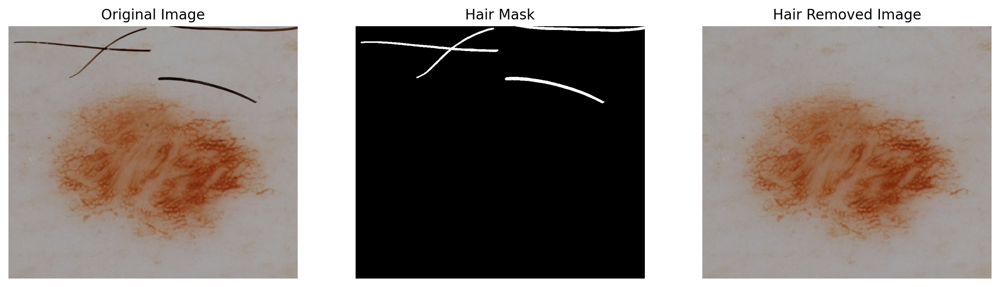

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define a function for hair removal from an image using a pre-existing hair mask
def remove_hair_with_mask(image, hair_mask):
    # Inpaint the hair regions using the Navier-Stokes equation and the hair mask
    result = cv2.inpaint(image, hair_mask, inpaintRadius=5, flags=cv2.INPAINT_TELEA)
    return result

# Example usage
if __name__ == "__main__":
    # Load an example image (replace with your image loading code)
    image = cv2.imread('/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0000461_oth_s_d.jpg')

    # Load the pre-existing hair mask (replace with your mask loading code)
    hair_mask = cv2.imread('/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/mask/ISIC2019_0000461_oth_s_gt.jpg', cv2.IMREAD_GRAYSCALE)

    # Apply hair removal using the mask
    hair_removed_image = remove_hair_with_mask(image, hair_mask)

    # Create a figure with three subplots
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Display the original image in the first subplot
    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    # Display the hair mask in the second subplot
    axes[1].imshow(hair_mask, cmap='gray')
    axes[1].set_title('Hair Mask')
    axes[1].axis('off')

    # Display the hair-removed image in the third subplot
    axes[2].imshow(cv2.cvtColor(hair_removed_image, cv2.COLOR_BGR2RGB))
    axes[2].set_title('Hair Removed Image')
    axes[2].axis('off')

    # Show the figure with subplots
    plt.show()


In [ ]:
# Apply the test transformation directly to the NumPy array
preprocessed_image = transform_test(hair_removed_image)

# Convert the preprocessed image to a PyTorch tensor
image_tensor = preprocessed_image.unsqueeze(0).to(device)

# Perform inference
with torch.no_grad():
  outputs, _ = model(image_tensor)  # Adjust this line based on your model's output format
  probabilities = torch.softmax(outputs, dim=1)  # Compute class probabilities
  _, predicted_label = torch.max(outputs, 1)  # Get the predicted class label

# Append the predicted label and probabilities to the lists
predicted_labels.append(predicted_label.item())
predicted_probs.append(probabilities.squeeze().cpu().numpy())

# Now, 'predicted_labels' contains the predicted class labels for each image,
# and 'predicted_probs' contains the class probabilities for each image.


In [ ]:
predicted_labels

[0, 0, 0, 0]

In [ ]:
predicted_probs

[array([0.63281786, 0.3671822 ], dtype=float32),
 array([0.60226107, 0.39773896], dtype=float32),
 array([0.5738065 , 0.42619348], dtype=float32),
 array([0.51289654, 0.4871034 ], dtype=float32)]

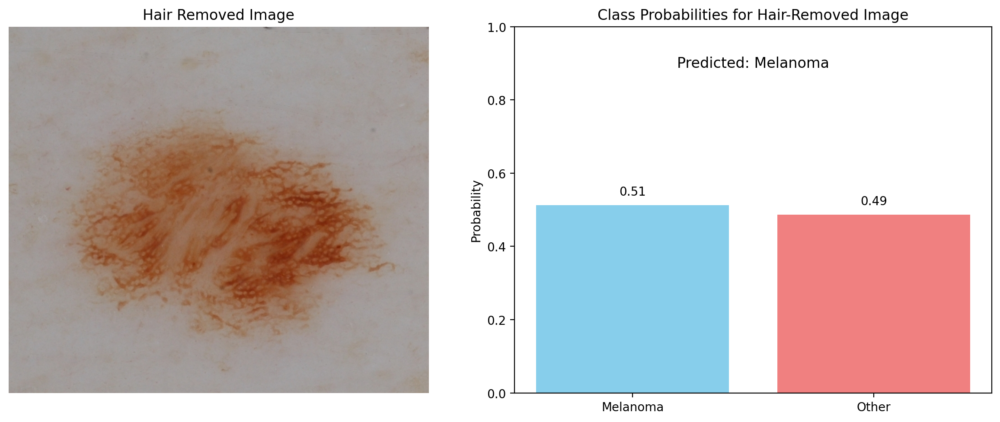

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'predicted_probabilities' contains the class probabilities for the hair-removed image
class_probabilities = predicted_probs[3]

class_labels = ['Melanoma', 'Other']  # Adjust based on your class labels
colors = ['#87CEEB', '#F08080']  # Colors for the bar chart

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Display the original image in the first subplot (ax1)
ax1.imshow(cv2.cvtColor(hair_removed_image, cv2.COLOR_BGR2RGB))
ax1.set_title('Hair Removed Image')
ax1.axis('off')

# Create the bar chart in the second subplot (ax2)
ax2.bar(class_labels, class_probabilities, color=colors)
ax2.set_ylabel('Probability')
ax2.set_title('Class Probabilities for Hair-Removed Image')
ax2.set_ylim([0, 1])  # Set the y-axis limit to [0, 1] for probability values

# Add text labels for each bar
for i, prob in enumerate(class_probabilities):
    ax2.text(i, prob + 0.02, f'{prob:.2f}', ha='center', va='bottom')

# Add the predicted label as text on the graph
predicted_class_label = 'Melanoma' if predicted_labels[3] == 0 else 'Other'
ax2.text(0.5, 0.9, f'Predicted: {predicted_class_label}', ha='center', va='center', fontsize=12)

# Show the figure with subplots
plt.tight_layout()
plt.show()



In [ ]:
import cv2
import numpy as np

def psnr(original, inpainted):
    # Ensure both images have the same data type
    original = original.astype(np.float32)
    inpainted = inpainted.astype(np.float32)

    # Calculate the squared error between the original and inpainted images
    mse = np.mean((original - inpainted) ** 2)

    # Calculate the maximum possible pixel value
    max_pixel_value = np.max(original)

    # Calculate PSNR
    psnr_value = 20 * np.log10(max_pixel_value / np.sqrt(mse))

    return psnr_value

if __name__ == "__main__":

    # Ensure both images have the same dimensions
    original_image = cv2.resize(image, (hair_removed_image.shape[1], hair_removed_image.shape[0]))

    # Calculate PSNR
    psnr_value = psnr(image, hair_removed_image)

    print(f"PSNR: {psnr_value} dB")


PSNR: 22.382678985595703 dB


# Hair Removal Example 2

In [ ]:
import cv2

# Define the file paths to your three images
image_paths = [
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2017_0000081_oth_m_d.jpg',
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2017_0000081_oth_m_b.jpg',
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2017_0000081_oth_m_l.jpg'
]

# Initialize an empty list to store the loaded images
test_images = []

# Load the images
for image_path in image_paths:
    img = cv2.imread(image_path)
    if img is not None:
        test_images.append(img)


In [ ]:
model_path = '/content/Drive/MyDrive/MSc_Project/best-model-20.pt'  # Path to your saved model
model.load_state_dict(torch.load(model_path, map_location=device))

<All keys matched successfully>

In [ ]:
import torch
import numpy as np
from torchvision import transforms

# Assuming you have a pre-trained model loaded and defined as 'model'
# Also, 'test_images' contains the three images as NumPy arrays

# Initialize an empty list to store the predicted labels and probabilities
predicted_labels = []
predicted_probs = []

# Set the model in evaluation mode
model.eval()

# Define a device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Preprocess and perform inference for each image
for image_numpy in test_images:
    # Apply the test transformation directly to the NumPy array
    preprocessed_image = transform_test(image_numpy)

    # Convert the preprocessed image to a PyTorch tensor
    image_tensor = preprocessed_image.unsqueeze(0).to(device)

    # Perform inference
    with torch.no_grad():
        outputs, _ = model(image_tensor)  # Adjust this line based on your model's output format
        probabilities = torch.softmax(outputs, dim=1)  # Compute class probabilities
        _, predicted_label = torch.max(outputs, 1)  # Get the predicted class label

    # Append the predicted label and probabilities to the lists
    predicted_labels.append(predicted_label.item())
    predicted_probs.append(probabilities.squeeze().cpu().numpy())

# Now, 'predicted_labels' contains the predicted class labels for each image,
# and 'predicted_probs' contains the class probabilities for each image.


In [ ]:
predicted_labels

[1, 1, 1]

In [ ]:
predicted_probs

[array([0.3553163, 0.6446837], dtype=float32),
 array([0.36063948, 0.6393605 ], dtype=float32),
 array([0.3443188, 0.6556812], dtype=float32)]

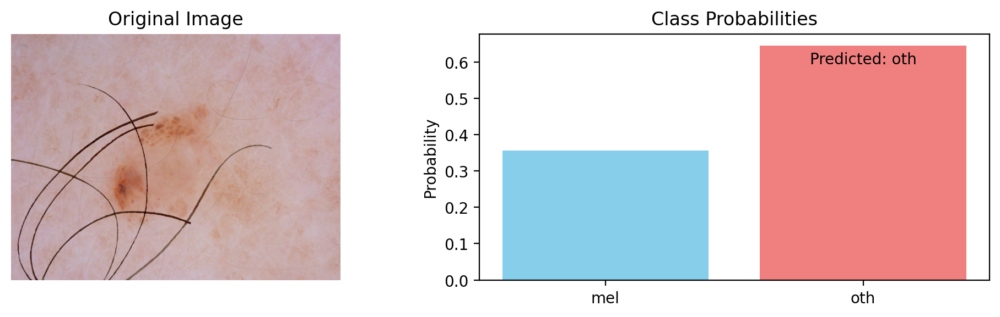

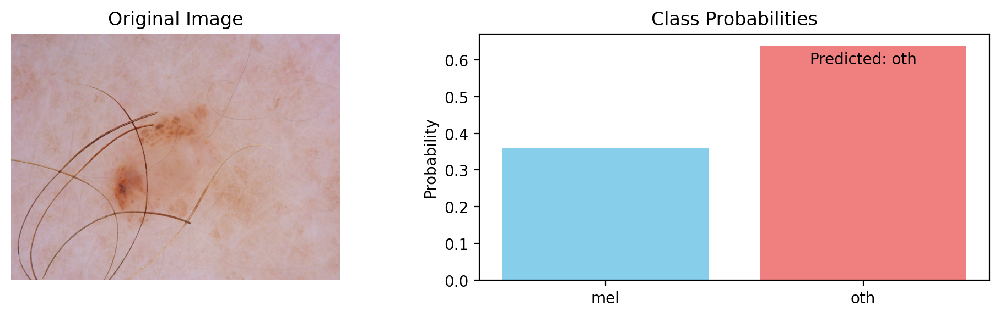

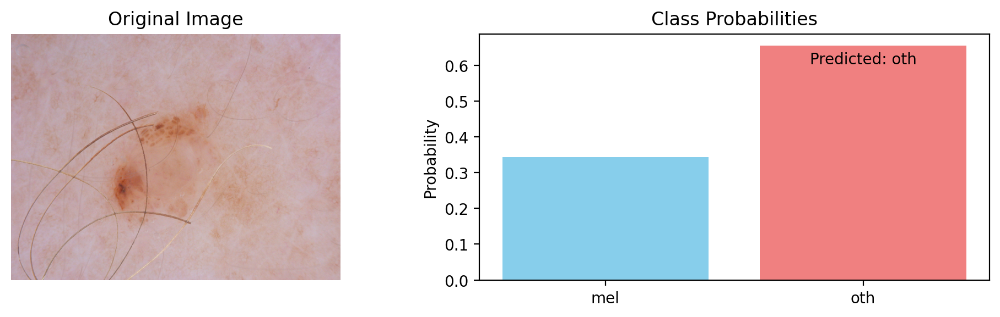

In [ ]:
# Define class labels based on your class indices
class_labels = {0: 'mel', 1: 'oth'}

# Define a list of colors for your bar chart
colors = ['#87CEEB', '#F08080']

for i in range(len(test_images)):
    # Load the original image
    original_image = cv2.imread(image_paths[i])

    # Get the predicted label and probabilities
    predicted_label = predicted_labels[i]
    predicted_probabilities = predicted_probs[i]

    # Create a figure with subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))

    # Display the original image
    ax1.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    ax1.axis('off')
    ax1.set_title('Original Image')

    # Create a bar chart for class probabilities
    ax2.bar(class_labels.values(), predicted_probabilities, color=colors)
    ax2.set_ylabel('Probability')
    ax2.set_title('Class Probabilities')

    # Add predicted label as text on the bar chart
    ax2.text(predicted_label, predicted_probabilities[predicted_label] - 0.05,
             f'Predicted: {class_labels[predicted_label]}', ha='center')

    # Show the plot
    plt.tight_layout()
    plt.show()


## Hair Removal

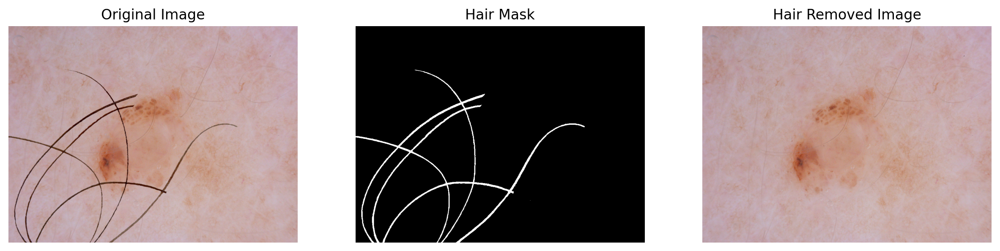

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define a function for hair removal from an image using a pre-existing hair mask
def remove_hair_with_mask(image, hair_mask):
    # Inpaint the hair regions using the Navier-Stokes equation and the hair mask
    result = cv2.inpaint(image, hair_mask, inpaintRadius=5, flags=cv2.INPAINT_TELEA)
    return result

# Example usage
if __name__ == "__main__":
    # Load an example image (replace with your image loading code)
    image = cv2.imread('/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2017_0000081_oth_m_d.jpg')

    # Load the pre-existing hair mask (replace with your mask loading code)
    hair_mask = cv2.imread('/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/mask/ISIC2017_0000081_oth_m_gt.jpg', cv2.IMREAD_GRAYSCALE)

    # Apply hair removal using the mask
    hair_removed_image = remove_hair_with_mask(image, hair_mask)

    # Create a figure with three subplots
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Display the original image in the first subplot
    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    # Display the hair mask in the second subplot
    axes[1].imshow(hair_mask, cmap='gray')
    axes[1].set_title('Hair Mask')
    axes[1].axis('off')

    # Display the hair-removed image in the third subplot
    axes[2].imshow(cv2.cvtColor(hair_removed_image, cv2.COLOR_BGR2RGB))
    axes[2].set_title('Hair Removed Image')
    axes[2].axis('off')

    # Show the figure with subplots
    plt.show()


In [ ]:
# Apply the test transformation directly to the NumPy array
preprocessed_image = transform_test(hair_removed_image)

# Convert the preprocessed image to a PyTorch tensor
image_tensor = preprocessed_image.unsqueeze(0).to(device)

# Perform inference
with torch.no_grad():
  outputs, _ = model(image_tensor)  # Adjust this line based on your model's output format
  probabilities = torch.softmax(outputs, dim=1)  # Compute class probabilities
  _, predicted_label = torch.max(outputs, 1)  # Get the predicted class label

# Append the predicted label and probabilities to the lists
predicted_labels.append(predicted_label.item())
predicted_probs.append(probabilities.squeeze().cpu().numpy())

# Now, 'predicted_labels' contains the predicted class labels for each image,
# and 'predicted_probs' contains the class probabilities for each image.


In [ ]:
predicted_labels

[1, 1, 1, 1]

In [ ]:
predicted_probs

[array([0.3553163, 0.6446837], dtype=float32),
 array([0.36063948, 0.6393605 ], dtype=float32),
 array([0.3443188, 0.6556812], dtype=float32),
 array([0.32935634, 0.6706436 ], dtype=float32)]

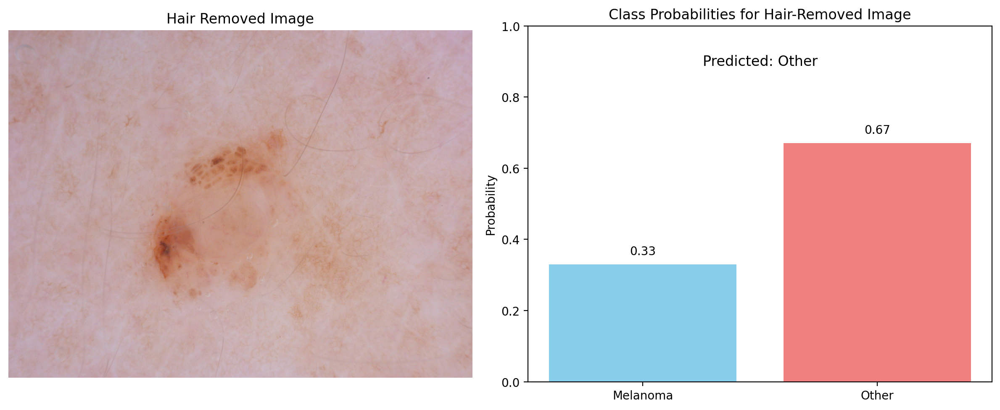

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'predicted_probabilities' contains the class probabilities for the hair-removed image
class_probabilities = predicted_probs[3]

class_labels = ['Melanoma', 'Other']  # Adjust based on your class labels
colors = ['#87CEEB', '#F08080']  # Colors for the bar chart

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Display the original image in the first subplot (ax1)
ax1.imshow(cv2.cvtColor(hair_removed_image, cv2.COLOR_BGR2RGB))
ax1.set_title('Hair Removed Image')
ax1.axis('off')

# Create the bar chart in the second subplot (ax2)
ax2.bar(class_labels, class_probabilities, color=colors)
ax2.set_ylabel('Probability')
ax2.set_title('Class Probabilities for Hair-Removed Image')
ax2.set_ylim([0, 1])  # Set the y-axis limit to [0, 1] for probability values

# Add text labels for each bar
for i, prob in enumerate(class_probabilities):
    ax2.text(i, prob + 0.02, f'{prob:.2f}', ha='center', va='bottom')

# Add the predicted label as text on the graph
predicted_class_label = 'Melanoma' if predicted_labels[3] == 0 else 'Other'
ax2.text(0.5, 0.9, f'Predicted: {predicted_class_label}', ha='center', va='center', fontsize=12)

# Show the figure with subplots
plt.tight_layout()
plt.show()



In [ ]:
import cv2
import numpy as np

def psnr(original, inpainted):
    # Ensure both images have the same data type
    original = original.astype(np.float32)
    inpainted = inpainted.astype(np.float32)

    # Calculate the squared error between the original and inpainted images
    mse = np.mean((original - inpainted) ** 2)

    # Calculate the maximum possible pixel value
    max_pixel_value = np.max(original)

    # Calculate PSNR
    psnr_value = 20 * np.log10(max_pixel_value / np.sqrt(mse))

    return psnr_value

if __name__ == "__main__":

    # Ensure both images have the same dimensions
    original_image = cv2.resize(image, (hair_removed_image.shape[1], hair_removed_image.shape[0]))

    # Calculate PSNR
    psnr_value = psnr(image, hair_removed_image)

    print(f"PSNR: {psnr_value} dB")


PSNR: 22.29755401611328 dB


# Hair Removal Example 3

In [ ]:
import cv2

# Define the file paths to your three images
image_paths = [
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0073205_oth_s_d.jpg',
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0073205_oth_s_b.jpg',
    '/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0073205_oth_s_l.jpg'
]

# Initialize an empty list to store the loaded images
test_images = []

# Load the images
for image_path in image_paths:
    img = cv2.imread(image_path)
    if img is not None:
        test_images.append(img)


In [ ]:
model_path = '/content/Drive/MyDrive/MSc_Project/best-model-20.pt'  # Path to your saved model
model.load_state_dict(torch.load(model_path, map_location=device))

<All keys matched successfully>

In [ ]:
import torch
import numpy as np
from torchvision import transforms

# Assuming you have a pre-trained model loaded and defined as 'model'
# Also, 'test_images' contains the three images as NumPy arrays

# Initialize an empty list to store the predicted labels and probabilities
predicted_labels = []
predicted_probs = []

# Set the model in evaluation mode
model.eval()

# Define a device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Preprocess and perform inference for each image
for image_numpy in test_images:
    # Apply the test transformation directly to the NumPy array
    preprocessed_image = transform_test(image_numpy)

    # Convert the preprocessed image to a PyTorch tensor
    image_tensor = preprocessed_image.unsqueeze(0).to(device)

    # Perform inference
    with torch.no_grad():
        outputs, _ = model(image_tensor)  # Adjust this line based on your model's output format
        probabilities = torch.softmax(outputs, dim=1)  # Compute class probabilities
        _, predicted_label = torch.max(outputs, 1)  # Get the predicted class label

    # Append the predicted label and probabilities to the lists
    predicted_labels.append(predicted_label.item())
    predicted_probs.append(probabilities.squeeze().cpu().numpy())

# Now, 'predicted_labels' contains the predicted class labels for each image,
# and 'predicted_probs' contains the class probabilities for each image.


In [ ]:
predicted_labels

[1, 1, 1]

In [ ]:
predicted_probs

[array([0.4019897 , 0.59801024], dtype=float32),
 array([0.3980556, 0.6019444], dtype=float32),
 array([0.39325514, 0.6067448 ], dtype=float32)]

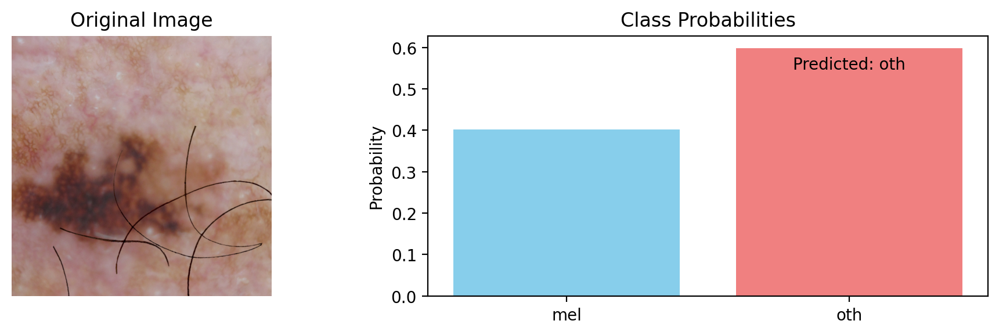

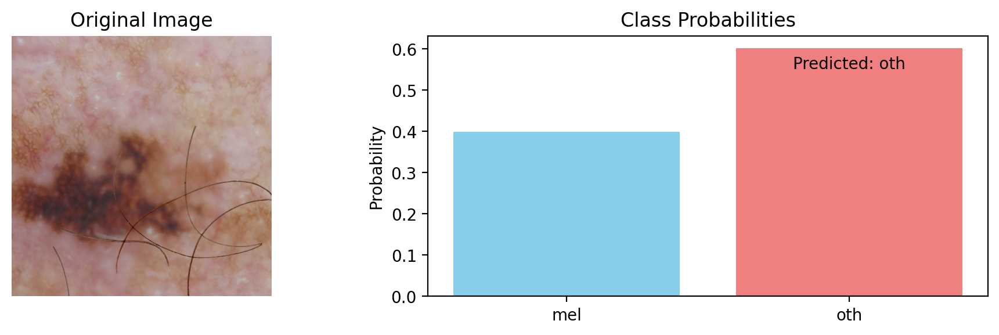

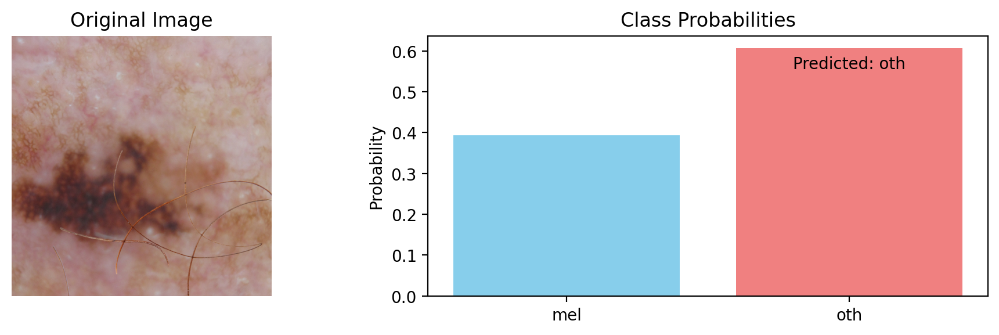

In [ ]:
# Define class labels based on your class indices
class_labels = {0: 'mel', 1: 'oth'}

# Define a list of colors for your bar chart
colors = ['#87CEEB', '#F08080']

for i in range(len(test_images)):
    # Load the original image
    original_image = cv2.imread(image_paths[i])

    # Get the predicted label and probabilities
    predicted_label = predicted_labels[i]
    predicted_probabilities = predicted_probs[i]

    # Create a figure with subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))

    # Display the original image
    ax1.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    ax1.axis('off')
    ax1.set_title('Original Image')

    # Create a bar chart for class probabilities
    ax2.bar(class_labels.values(), predicted_probabilities, color=colors)
    ax2.set_ylabel('Probability')
    ax2.set_title('Class Probabilities')

    # Add predicted label as text on the bar chart
    ax2.text(predicted_label, predicted_probabilities[predicted_label] - 0.05,
             f'Predicted: {class_labels[predicted_label]}', ha='center')

    # Show the plot
    plt.tight_layout()
    plt.show()


## Hair Removal

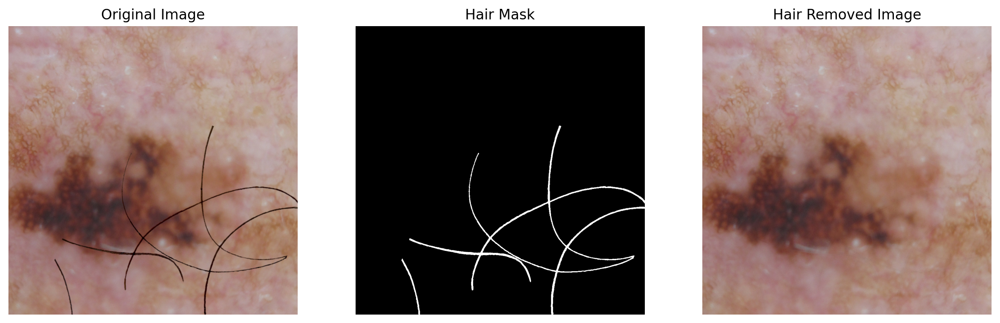

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define a function for hair removal from an image using a pre-existing hair mask
def remove_hair_with_mask(image, hair_mask):
    # Inpaint the hair regions using the Navier-Stokes equation and the hair mask
    result = cv2.inpaint(image, hair_mask, inpaintRadius=5, flags=cv2.INPAINT_TELEA)
    return result

# Example usage
if __name__ == "__main__":
    # Load an example image (replace with your image loading code)
    image = cv2.imread('/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/photo with hair/ISIC2019_0073205_oth_s_d.jpg')

    # Load the pre-existing hair mask (replace with your mask loading code)
    hair_mask = cv2.imread('/content/Drive/MyDrive/MSc_Project/Skin_Image_Dataset/mask/ISIC2019_0073205_oth_s_gt.jpg', cv2.IMREAD_GRAYSCALE)

    # Apply hair removal using the mask
    hair_removed_image = remove_hair_with_mask(image, hair_mask)

    # Create a figure with three subplots
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Display the original image in the first subplot
    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    # Display the hair mask in the second subplot
    axes[1].imshow(hair_mask, cmap='gray')
    axes[1].set_title('Hair Mask')
    axes[1].axis('off')

    # Display the hair-removed image in the third subplot
    axes[2].imshow(cv2.cvtColor(hair_removed_image, cv2.COLOR_BGR2RGB))
    axes[2].set_title('Hair Removed Image')
    axes[2].axis('off')

    # Show the figure with subplots
    plt.show()


In [ ]:
# Apply the test transformation directly to the NumPy array
preprocessed_image = transform_test(hair_removed_image)

# Convert the preprocessed image to a PyTorch tensor
image_tensor = preprocessed_image.unsqueeze(0).to(device)

# Perform inference
with torch.no_grad():
  outputs, _ = model(image_tensor)  # Adjust this line based on your model's output format
  probabilities = torch.softmax(outputs, dim=1)  # Compute class probabilities
  _, predicted_label = torch.max(outputs, 1)  # Get the predicted class label

# Append the predicted label and probabilities to the lists
predicted_labels.append(predicted_label.item())
predicted_probs.append(probabilities.squeeze().cpu().numpy())

# Now, 'predicted_labels' contains the predicted class labels for each image,
# and 'predicted_probs' contains the class probabilities for each image.


In [ ]:
predicted_labels

[1, 1, 1, 1]

In [ ]:
predicted_probs

[array([0.4019897 , 0.59801024], dtype=float32),
 array([0.3980556, 0.6019444], dtype=float32),
 array([0.39325514, 0.6067448 ], dtype=float32),
 array([0.38712516, 0.61287487], dtype=float32)]

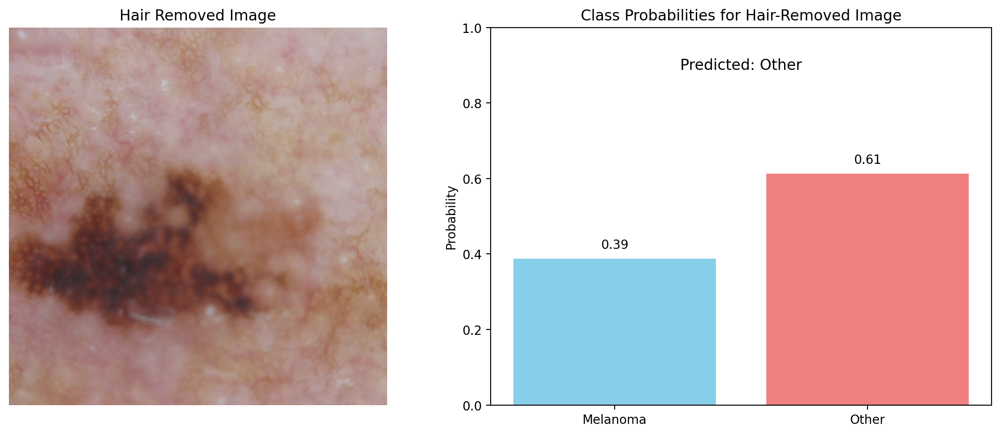

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'predicted_probabilities' contains the class probabilities for the hair-removed image
class_probabilities = predicted_probs[3]

class_labels = ['Melanoma', 'Other']  # Adjust based on your class labels
colors = ['#87CEEB', '#F08080']  # Colors for the bar chart

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Display the original image in the first subplot (ax1)
ax1.imshow(cv2.cvtColor(hair_removed_image, cv2.COLOR_BGR2RGB))
ax1.set_title('Hair Removed Image')
ax1.axis('off')

# Create the bar chart in the second subplot (ax2)
ax2.bar(class_labels, class_probabilities, color=colors)
ax2.set_ylabel('Probability')
ax2.set_title('Class Probabilities for Hair-Removed Image')
ax2.set_ylim([0, 1])  # Set the y-axis limit to [0, 1] for probability values

# Add text labels for each bar
for i, prob in enumerate(class_probabilities):
    ax2.text(i, prob + 0.02, f'{prob:.2f}', ha='center', va='bottom')

# Add the predicted label as text on the graph
predicted_class_label = 'Melanoma' if predicted_labels[3] == 0 else 'Other'
ax2.text(0.5, 0.9, f'Predicted: {predicted_class_label}', ha='center', va='center', fontsize=12)

# Show the figure with subplots
plt.tight_layout()
plt.show()



In [ ]:
import cv2
import numpy as np

def psnr(original, inpainted):
    # Ensure both images have the same data type
    original = original.astype(np.float32)
    inpainted = inpainted.astype(np.float32)

    # Calculate the squared error between the original and inpainted images
    mse = np.mean((original - inpainted) ** 2)

    # Calculate the maximum possible pixel value
    max_pixel_value = np.max(original)

    # Calculate PSNR
    psnr_value = 20 * np.log10(max_pixel_value / np.sqrt(mse))

    return psnr_value

if __name__ == "__main__":

    # Ensure both images have the same dimensions
    original_image = cv2.resize(image, (hair_removed_image.shape[1], hair_removed_image.shape[0]))

    # Calculate PSNR
    psnr_value = psnr(image, hair_removed_image)

    print(f"PSNR: {psnr_value} dB")


PSNR: 25.415446758270264 dB
